# Figure 3 - Feedback Weights

updated: May 16, 2022

This code has been organized after a long meeting with James on Sunday, May 15

The goal here is to show that the metric works for various scales of driving feedback weights Wfb.

#### Part 1 - Scale Driving Feedback, train with RFLO

#### Part 2 - Scale Driving Feedback, train with REINFORCE

code location: `rnn-learning/experiments/NeurIPS-2022-5-16/Fig3-Feedback-2022-5-16.ipynb`


In [1]:
pwd

'/Users/jacobportes/Documents/Code/rnn-learning/experiments/NeurIPS-2022-5-16'

In [1]:
folder = 'figs-2022-5-16/'

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FixedLocator,FixedFormatter
import matplotlib.pylab as pylab

# analysis
from sklearn.decomposition import PCA, FactorAnalysis
from sklearn.linear_model import LinearRegression
from scipy import interpolate # don't import stats
from scipy import linalg as LA
from scipy.ndimage.filters import uniform_filter1d

# miscellaneous
from tqdm import tqdm
from itertools import cycle
from copy import deepcopy
import pickle

import logging
import warnings
import dataclasses
from dataclasses import dataclass
from typing import Optional, List

import sys
sys.path.append("../..")

In [3]:
from rnn import RNNparams, RNN
from task import Task
from simulation import Simulation
from algorithms.bptt import BPTT
from algorithms.rflo import RFLO
from algorithms.reinforce import REINFORCE
from algorithms.track_vars import TrackVars
from algorithms.weight_mirror import WeightMirror

from utils.plotting import plot_trained_trajectories, paper_format
from utils.metric import cos_sim, return_norm_and_angle
from utils.functions import choose_aligned_matrix

from utils.metric import cos_sim, flow_field_data, flow_field_predicted, calculate_flow_field_correlation


In [4]:
trial_duration = 20
n_in=4
frac_on = 0.2

x_tonic = 0.0*np.ones((trial_duration, n_in)) # shape 20 x 4 i.e. time x channel
x_pulse1 = x_tonic.copy()
x_pulse2 = x_tonic.copy()
x_pulse3 = x_tonic.copy()
x_pulse4 = x_tonic.copy()
x_pulse1[0:int(trial_duration*frac_on),0] = 1
x_pulse2[0:int(trial_duration*frac_on),1] = 1
x_pulse3[0:int(trial_duration*frac_on),2] = 1
x_pulse4[0:int(trial_duration*frac_on),3] = 1

task1 = Task(x_in=x_pulse1,y_target=np.asarray([[1],[1]]))
task2 = Task(x_in=x_pulse2,y_target=np.asarray([[-1],[1]]))
task3 = Task(x_in=x_pulse3,y_target=np.asarray([[1],[-1]]))
task4 = Task(x_in=x_pulse4,y_target=np.asarray([[-1],[-1]]))

# Part 1 - RFLO, Strong Driving Feedback

Here are example hyperparameters that work nicely:

Note that for the above hyperparameters, scale_w_fb of 10 does not usually learn the task in the set number of trials.

The general approach here is as follows:

1. We choose $W^{bmi1}$ with respect to $W^{fb}$ in the following line:

```
""" w_out1 is chosen wrt w_fb and m (w_fb==w_m for simplicity) """
w_out1 = choose_aligned_matrix(net0.w_fb.copy().T,n_change=n_changes_w_out0,overlap=overlap_w_out0,rng=np.random.RandomState(seed),zero=False,tolerance=0.01,loop=1000)
```

2. We then scale $W^{fb}$ (but not $M$) before learning recurrent weights $W^{rec}$

```
net1 = RNN(params)
net1.set_weights(w_in=net0.w_in.copy(), w_rec=net0.w_rec.copy(),w_fb = scale*net0.w_fb.copy())
net1.set_weights(w_out = w_out1)
net1.set_weights(w_m = net0.w_fb.copy()) # don't scale w_m...this would effectively scale the learning rate
```

2it [00:00, 16.91it/s]

n_in: 4
n_rec: 50
n_out: 2
sig_in: 0.0
sig_rec: 0.1
sig_out: 0.01
tau_rec: 10
dt: 1.0
eta_in: 0.1
eta_rec: 0.1
eta_out: 0.1
g_in: 2.0
g_rec: 1.5
g_out: 2.0
g_fb: 2
driving_feedback: True
eta_fb: 0.1
sig_fb: 0.01
feedback_signal: position
velocity_transform: False
tau_vel: 0.8
dt_vel: 0.1
sig_rec_dim: None
eta_m: None
sig_m: None
lam_m: None
rng: <mtrand.RandomState object at 0x7f99fd7364c8>


3000it [00:53, 56.16it/s]
8it [00:00, 75.79it/s]

>> SCALE 0.5
M norm: 2.82	 M angle: 0.49, 1 iterations
w_out1 norm: 2.29	 w_out vs. w_out1 angle: 0.20
w_m norm: 2.82	 w_out1 vs. w_m angle: 0.49
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:06, 77.68it/s]
5000it [01:40, 49.70it/s]
500it [00:08, 56.26it/s]


AR early fit 0.947, late fit 0.986


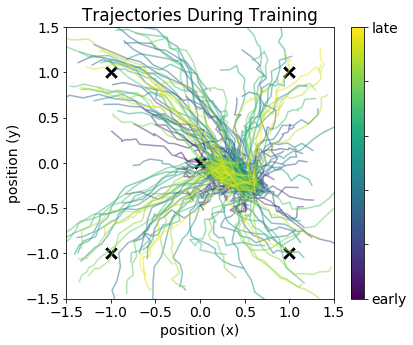

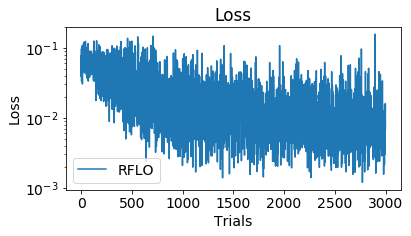

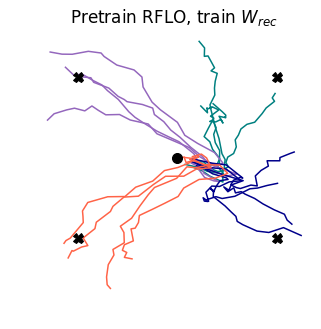

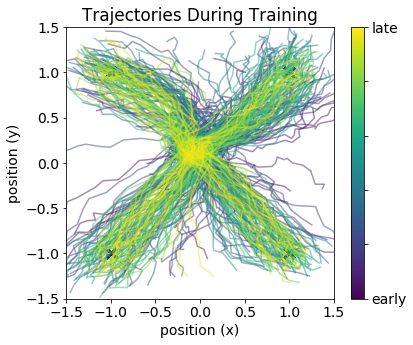

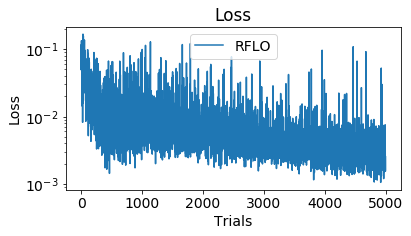

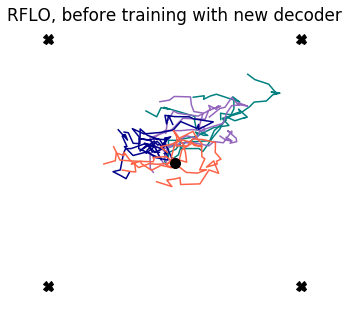

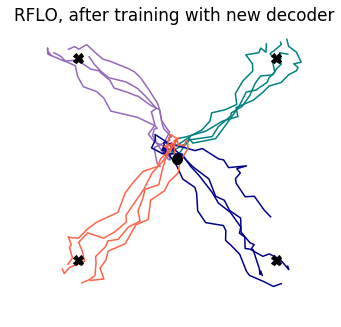

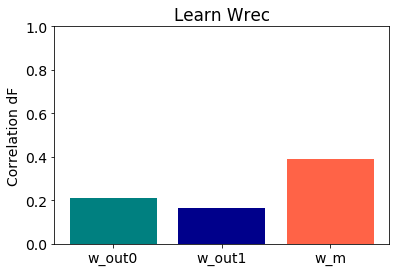

7it [00:00, 65.76it/s]

>> SCALE 1
M norm: 2.82	 M angle: 0.49, 1 iterations
w_out1 norm: 2.29	 w_out vs. w_out1 angle: 0.20
w_m norm: 2.82	 w_out1 vs. w_m angle: 0.49
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:06, 84.28it/s]
5000it [01:37, 51.33it/s]
500it [00:05, 87.19it/s]


AR early fit 0.953, late fit 0.986


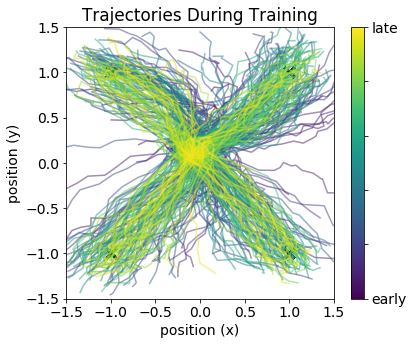

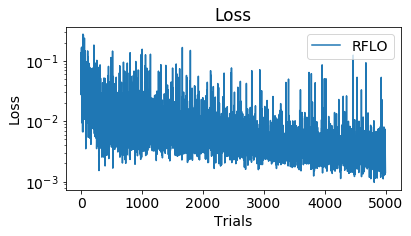

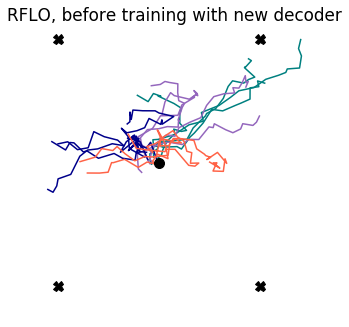

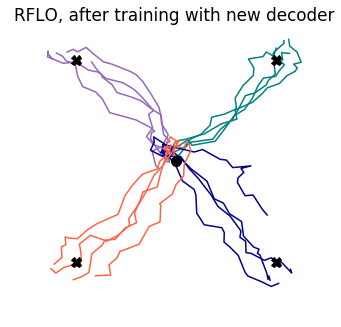

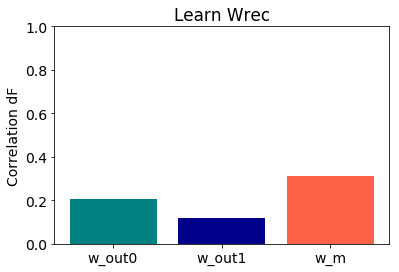

6it [00:00, 57.44it/s]

>> SCALE 2
M norm: 2.82	 M angle: 0.49, 1 iterations
w_out1 norm: 2.29	 w_out vs. w_out1 angle: 0.20
w_m norm: 2.82	 w_out1 vs. w_m angle: 0.49
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:06, 71.64it/s]
5000it [01:34, 53.11it/s]
500it [00:05, 81.56it/s]


AR early fit 0.974, late fit 0.987


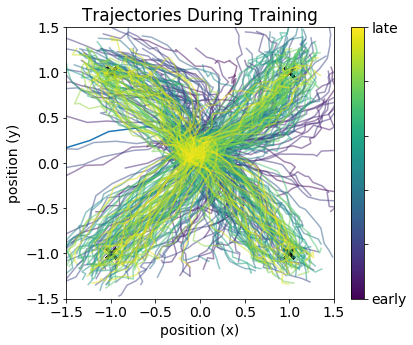

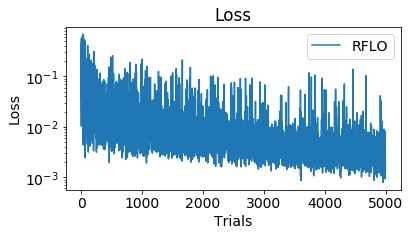

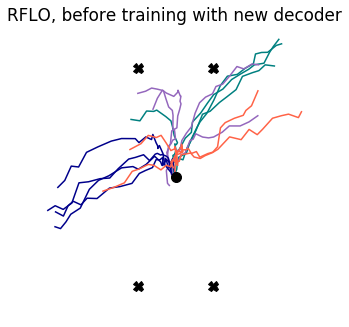

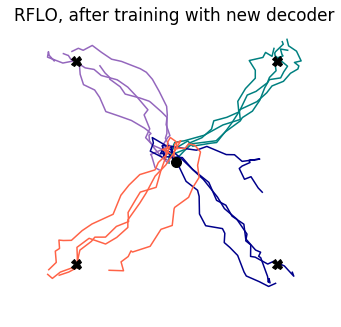

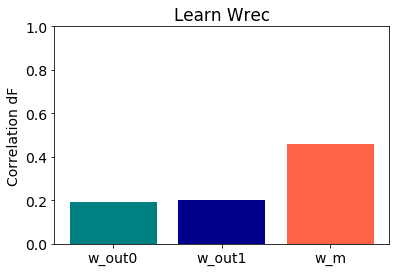

5it [00:00, 49.61it/s]

>> SCALE 5
M norm: 2.82	 M angle: 0.49, 1 iterations
w_out1 norm: 2.29	 w_out vs. w_out1 angle: 0.20
w_m norm: 2.82	 w_out1 vs. w_m angle: 0.49
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:06, 78.54it/s]
5000it [01:29, 55.90it/s]
500it [00:05, 84.25it/s]


AR early fit 0.989, late fit 0.989


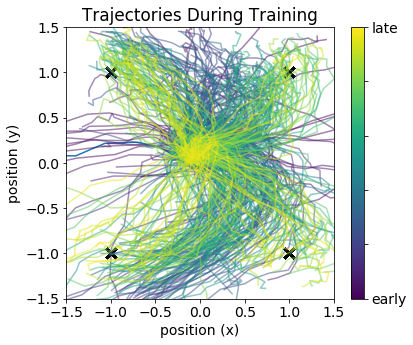

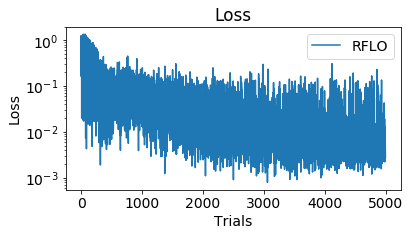

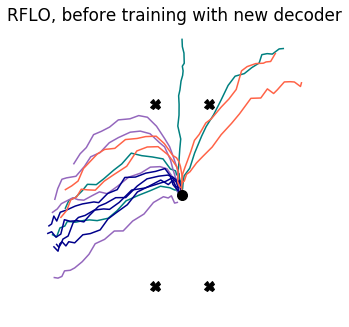

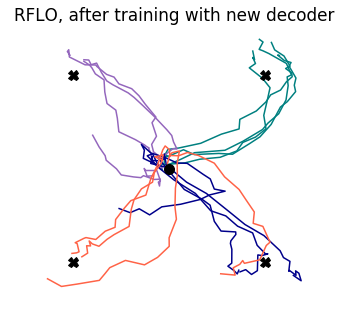

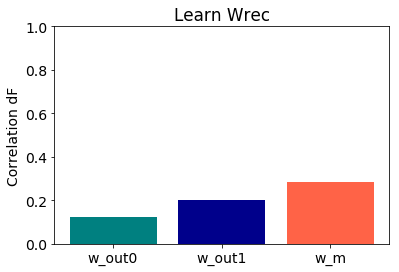

6it [00:00, 57.47it/s]

>> SCALE 10
M norm: 2.82	 M angle: 0.49, 1 iterations
w_out1 norm: 2.29	 w_out vs. w_out1 angle: 0.20
w_m norm: 2.82	 w_out1 vs. w_m angle: 0.49
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:05, 84.65it/s]
5000it [01:28, 57.31it/s]
500it [00:06, 76.56it/s]


AR early fit 0.990, late fit 0.985


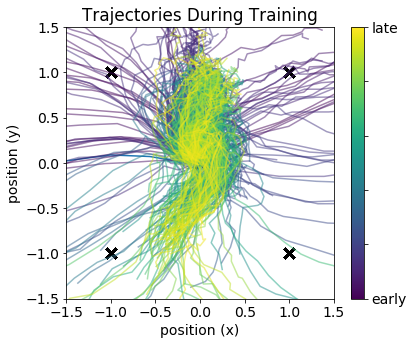

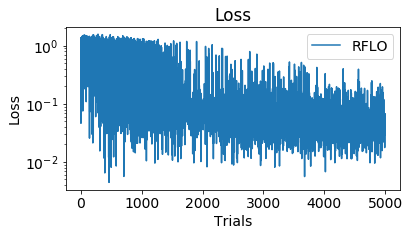

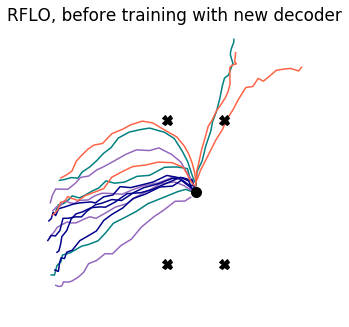

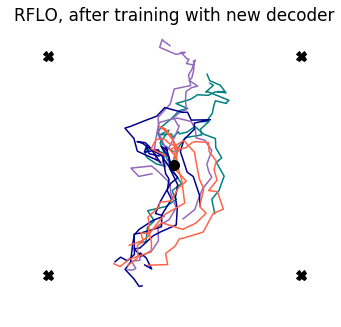

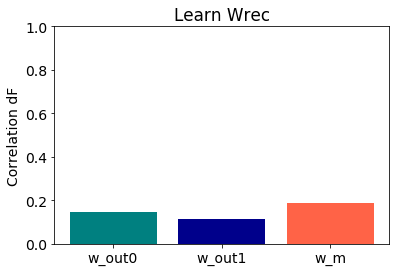

7it [00:00, 69.60it/s]

>> SCALE 0.5
M norm: 2.81	 M angle: 0.50, 16 iterations
w_out1 norm: 2.28	 w_out vs. w_out1 angle: 0.19
w_m norm: 2.81	 w_out1 vs. w_m angle: 0.50
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:06, 75.29it/s]
5000it [01:28, 56.81it/s]
500it [00:05, 87.05it/s]


AR early fit 0.950, late fit 0.986


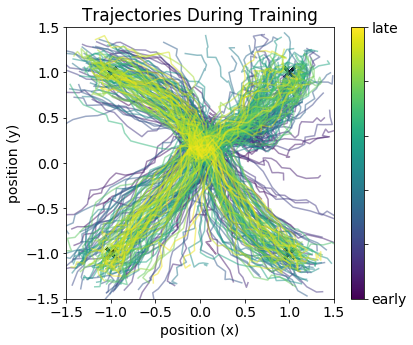

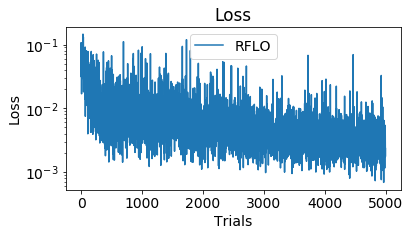

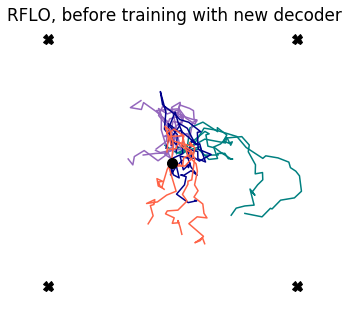

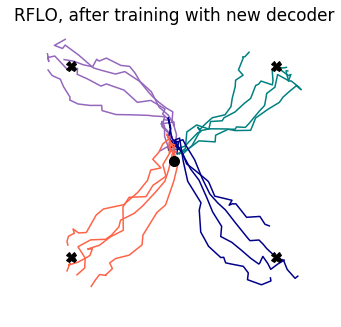

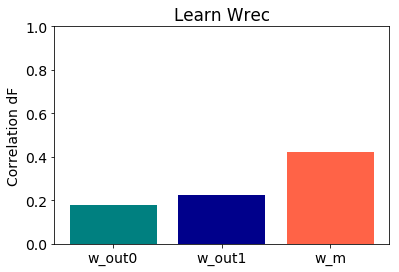

6it [00:00, 57.76it/s]

>> SCALE 1
M norm: 2.81	 M angle: 0.50, 16 iterations
w_out1 norm: 2.28	 w_out vs. w_out1 angle: 0.19
w_m norm: 2.81	 w_out1 vs. w_m angle: 0.50
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:05, 84.76it/s]
5000it [01:34, 52.67it/s]
500it [00:07, 69.42it/s]


AR early fit 0.959, late fit 0.986


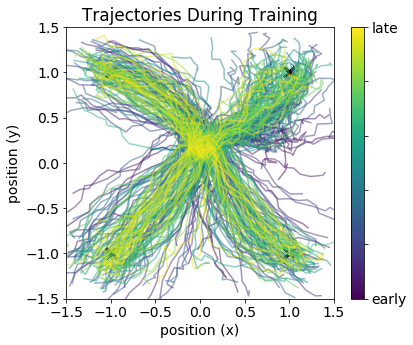

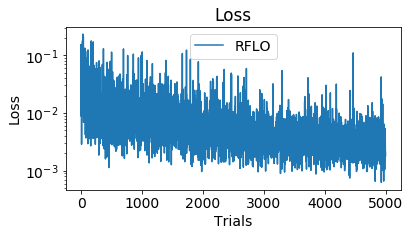

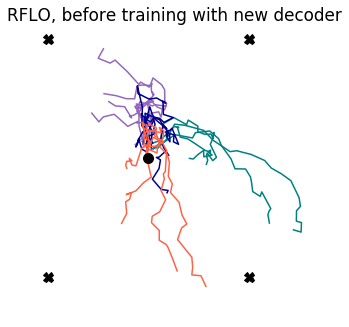

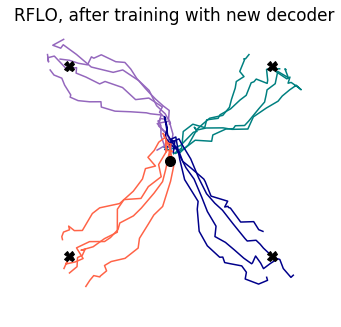

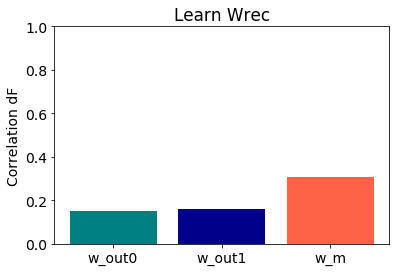

8it [00:00, 74.70it/s]

>> SCALE 2
M norm: 2.81	 M angle: 0.50, 16 iterations
w_out1 norm: 2.28	 w_out vs. w_out1 angle: 0.19
w_m norm: 2.81	 w_out1 vs. w_m angle: 0.50
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:05, 84.40it/s]
5000it [01:23, 59.84it/s]
500it [00:05, 84.67it/s]


AR early fit 0.976, late fit 0.988


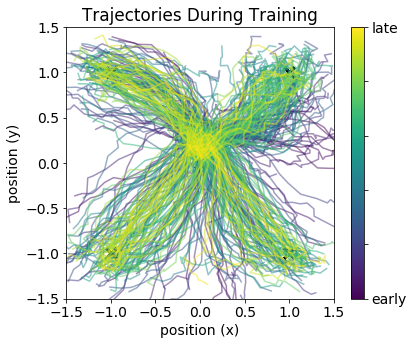

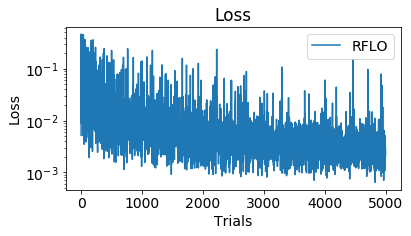

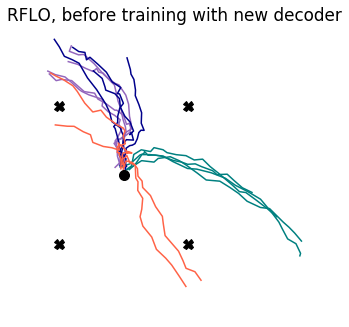

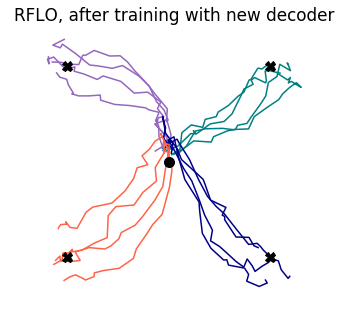

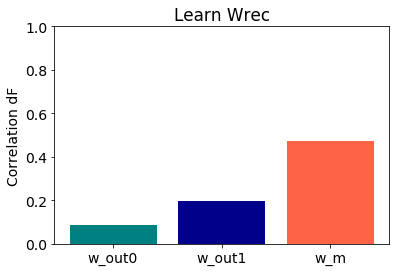

8it [00:00, 70.55it/s]

>> SCALE 5
M norm: 2.81	 M angle: 0.50, 16 iterations
w_out1 norm: 2.28	 w_out vs. w_out1 angle: 0.19
w_m norm: 2.81	 w_out1 vs. w_m angle: 0.50
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:05, 84.72it/s]
5000it [01:28, 56.25it/s]
500it [00:06, 79.25it/s]


AR early fit 0.987, late fit 0.989


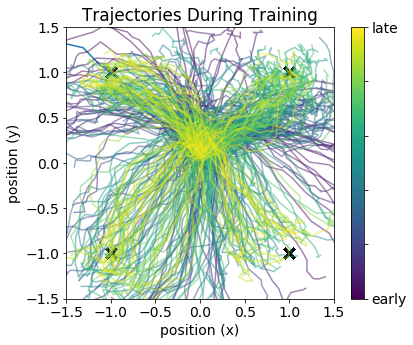

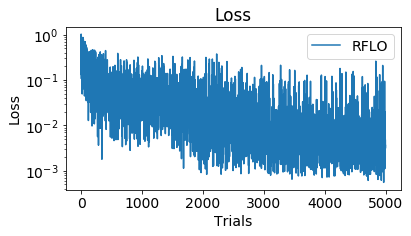

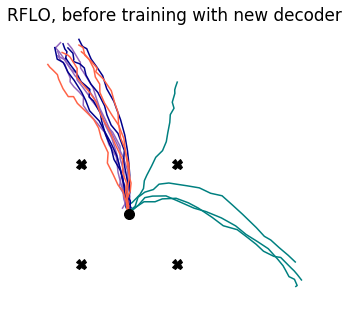

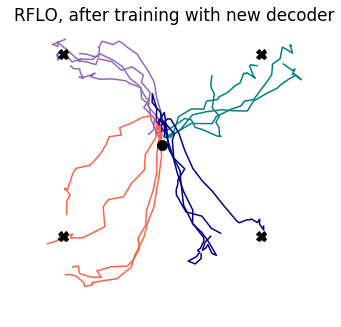

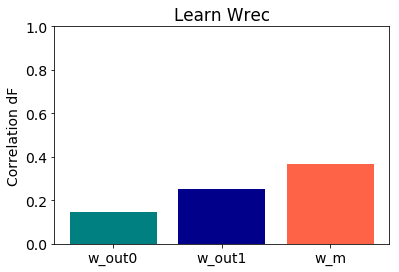

5it [00:00, 47.13it/s]

>> SCALE 10
M norm: 2.81	 M angle: 0.50, 16 iterations
w_out1 norm: 2.28	 w_out vs. w_out1 angle: 0.19
w_m norm: 2.81	 w_out1 vs. w_m angle: 0.50
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:06, 77.12it/s]
5000it [01:23, 59.82it/s]
500it [00:06, 81.48it/s]


AR early fit 0.989, late fit 0.987


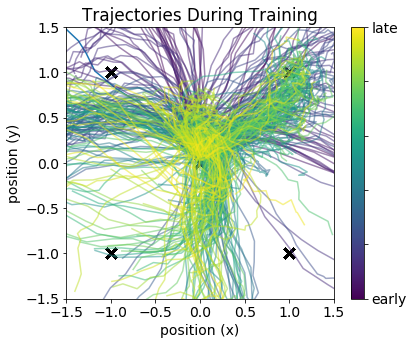

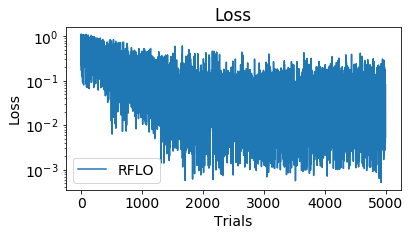

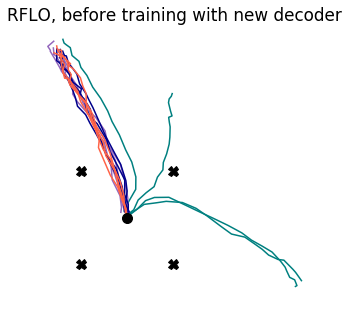

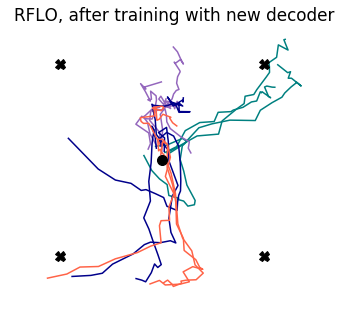

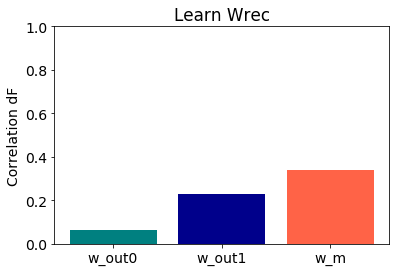

6it [00:00, 49.71it/s]

>> SCALE 0.5
M norm: 2.82	 M angle: 0.49, 56 iterations
w_out1 norm: 2.16	 w_out vs. w_out1 angle: 0.31
w_m norm: 2.82	 w_out1 vs. w_m angle: 0.49
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:06, 82.56it/s]
5000it [01:17, 64.68it/s]
500it [00:05, 84.13it/s]


AR early fit 0.950, late fit 0.981


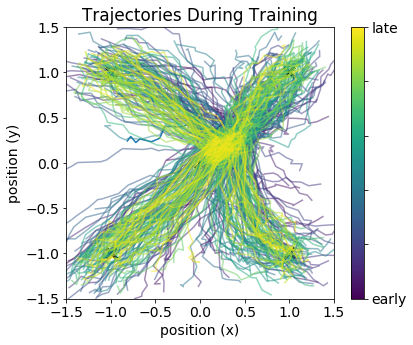

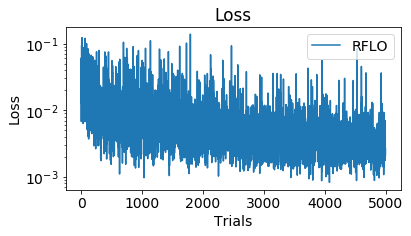

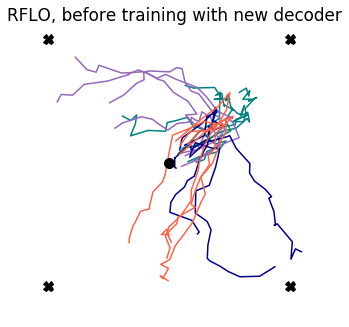

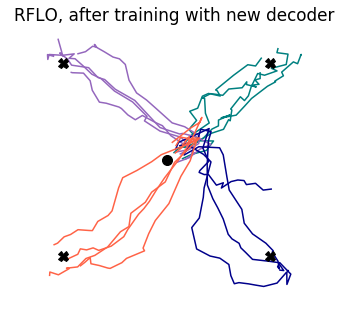

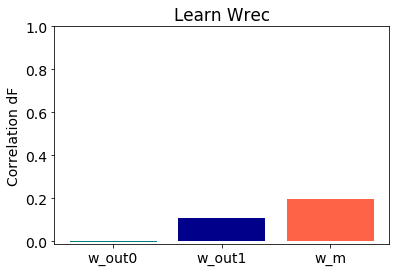

7it [00:00, 65.33it/s]

>> SCALE 1
M norm: 2.82	 M angle: 0.49, 56 iterations
w_out1 norm: 2.16	 w_out vs. w_out1 angle: 0.31
w_m norm: 2.82	 w_out1 vs. w_m angle: 0.49
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:05, 88.93it/s]
5000it [01:41, 49.22it/s]
500it [00:06, 79.46it/s]


AR early fit 0.958, late fit 0.981


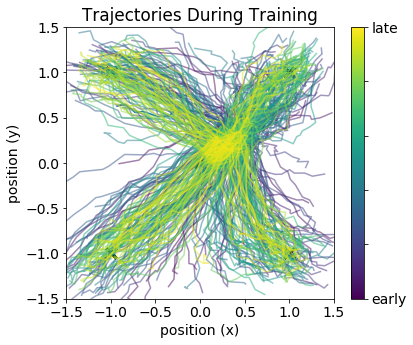

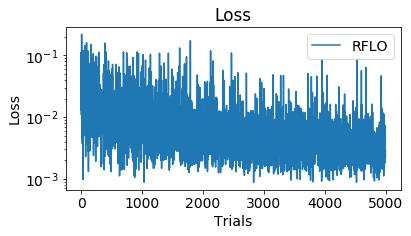

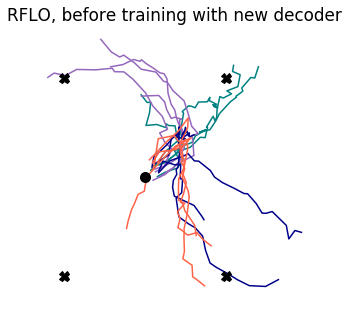

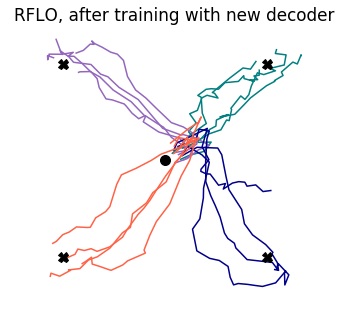

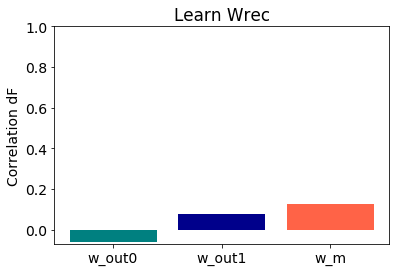

0it [00:00, ?it/s]

>> SCALE 2
M norm: 2.82	 M angle: 0.49, 56 iterations
w_out1 norm: 2.16	 w_out vs. w_out1 angle: 0.31
w_m norm: 2.82	 w_out1 vs. w_m angle: 0.49
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:06, 75.50it/s]
5000it [01:20, 62.20it/s]
500it [00:06, 82.38it/s]


AR early fit 0.968, late fit 0.984


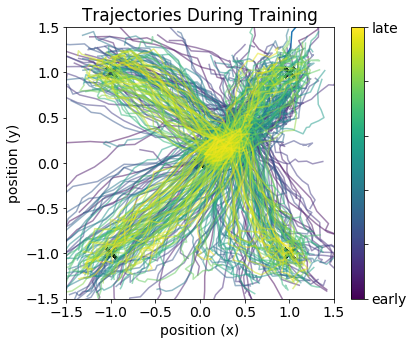

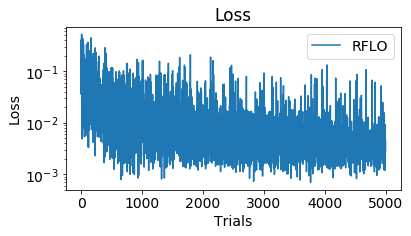

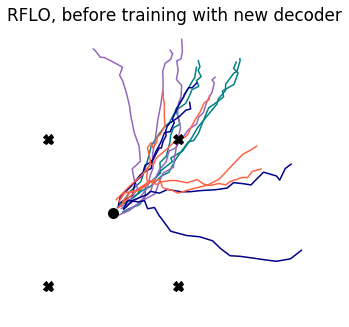

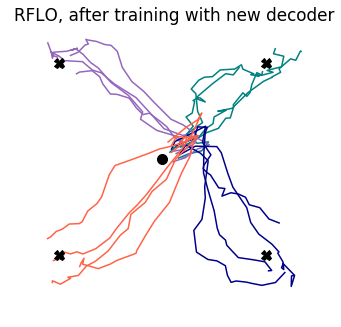

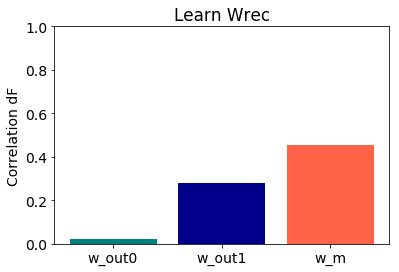

8it [00:00, 77.90it/s]

>> SCALE 5
M norm: 2.82	 M angle: 0.49, 56 iterations
w_out1 norm: 2.16	 w_out vs. w_out1 angle: 0.31
w_m norm: 2.82	 w_out1 vs. w_m angle: 0.49
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:06, 78.29it/s]
5000it [01:22, 60.95it/s]
500it [00:08, 57.69it/s]


AR early fit 0.979, late fit 0.985


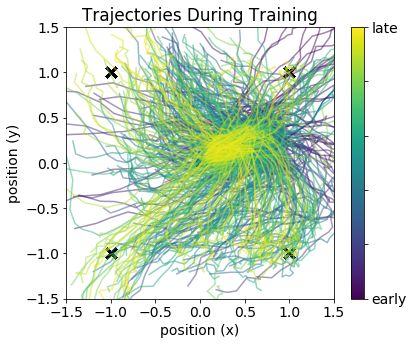

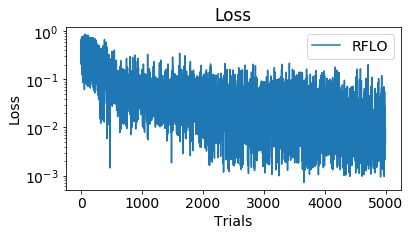

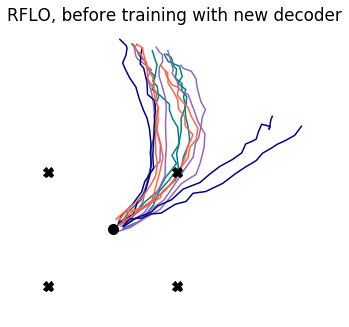

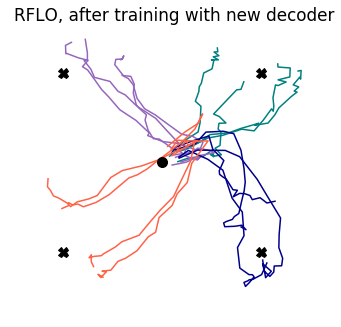

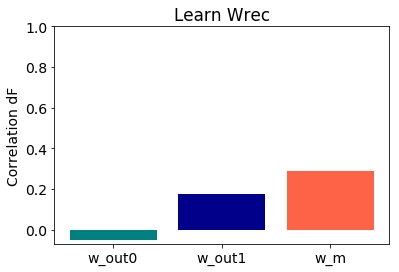

5it [00:00, 48.92it/s]

>> SCALE 10
M norm: 2.82	 M angle: 0.49, 56 iterations
w_out1 norm: 2.16	 w_out vs. w_out1 angle: 0.31
w_m norm: 2.82	 w_out1 vs. w_m angle: 0.49
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:06, 79.66it/s]
5000it [01:23, 59.56it/s]
500it [00:06, 82.75it/s]


AR early fit 0.982, late fit 0.980


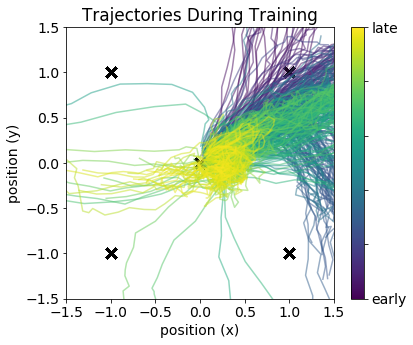

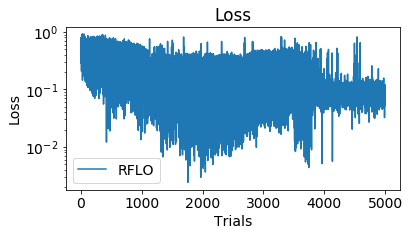

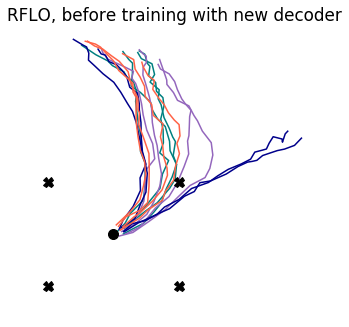

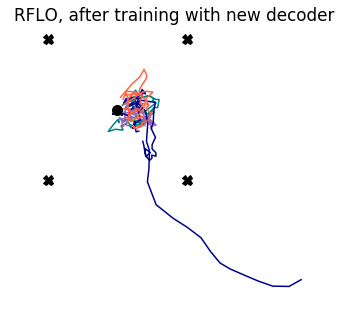

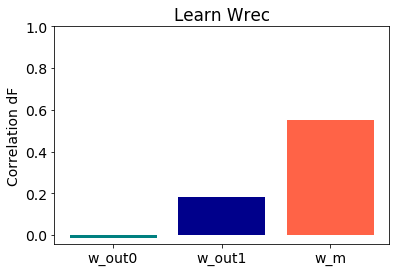

8it [00:00, 74.74it/s]

>> SCALE 0.5
M norm: 2.81	 M angle: 0.50, 25 iterations
w_out1 norm: 2.39	 w_out vs. w_out1 angle: 0.11
w_m norm: 2.81	 w_out1 vs. w_m angle: 0.50
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:05, 84.59it/s]
5000it [01:20, 62.17it/s]
500it [00:06, 77.70it/s]


AR early fit 0.946, late fit 0.987


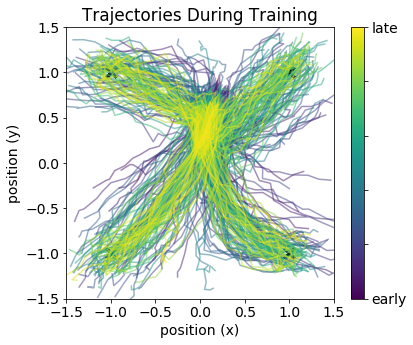

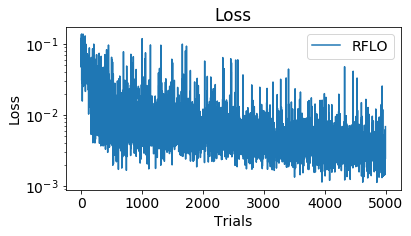

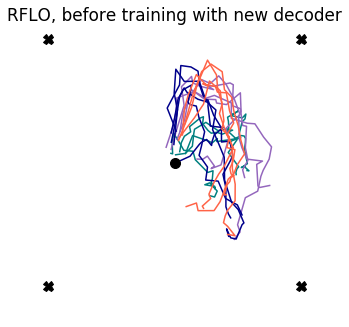

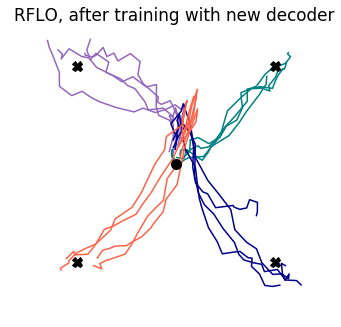

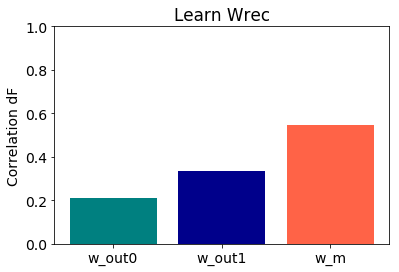

8it [00:00, 74.41it/s]

>> SCALE 1
M norm: 2.81	 M angle: 0.50, 25 iterations
w_out1 norm: 2.39	 w_out vs. w_out1 angle: 0.11
w_m norm: 2.81	 w_out1 vs. w_m angle: 0.50
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:06, 83.09it/s]
5000it [01:22, 60.93it/s]
500it [00:05, 83.92it/s]


AR early fit 0.951, late fit 0.987


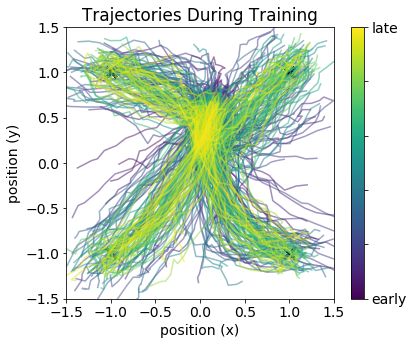

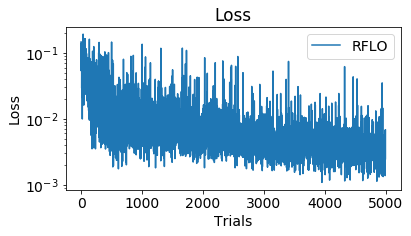

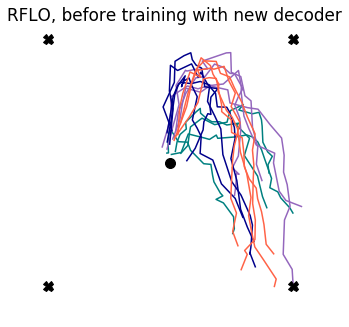

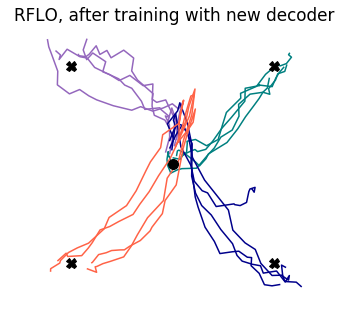

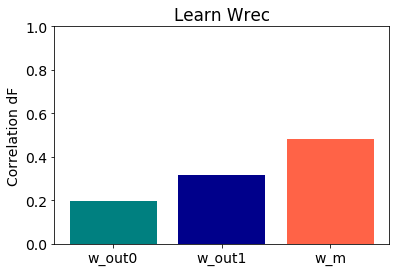

3it [00:00, 29.60it/s]

>> SCALE 2
M norm: 2.81	 M angle: 0.50, 25 iterations
w_out1 norm: 2.39	 w_out vs. w_out1 angle: 0.11
w_m norm: 2.81	 w_out1 vs. w_m angle: 0.50
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:07, 71.10it/s]
5000it [01:25, 58.67it/s]
500it [00:06, 81.22it/s]


AR early fit 0.966, late fit 0.988


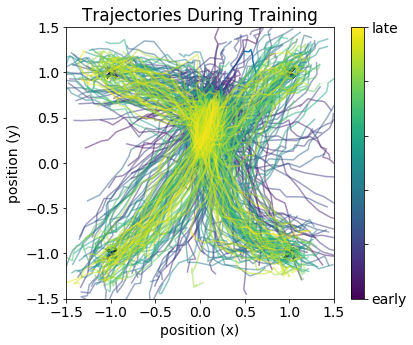

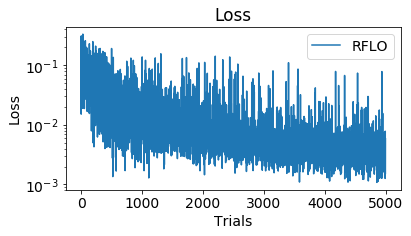

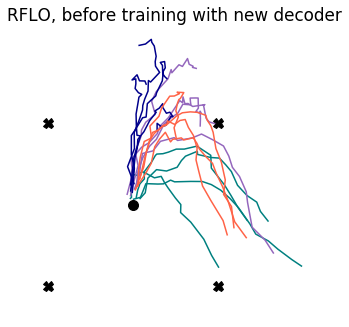

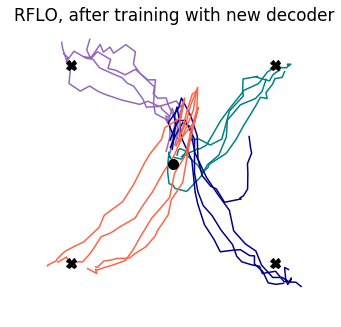

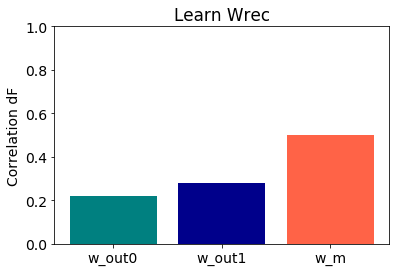

8it [00:00, 74.61it/s]

>> SCALE 5
M norm: 2.81	 M angle: 0.50, 25 iterations
w_out1 norm: 2.39	 w_out vs. w_out1 angle: 0.11
w_m norm: 2.81	 w_out1 vs. w_m angle: 0.50
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:06, 82.04it/s]
5000it [01:25, 58.50it/s]
500it [00:06, 73.83it/s]


AR early fit 0.979, late fit 0.987


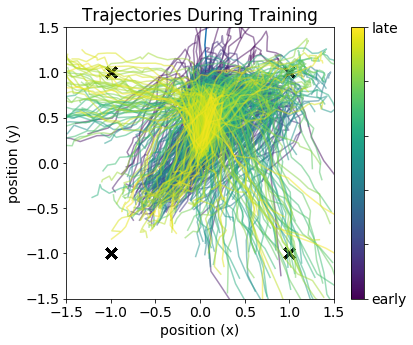

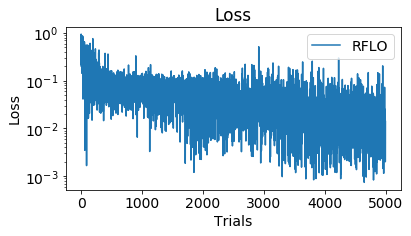

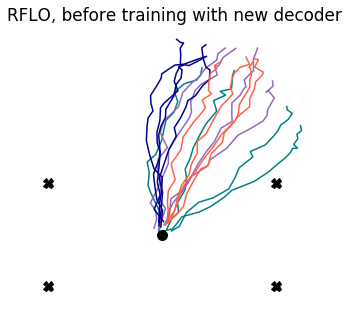

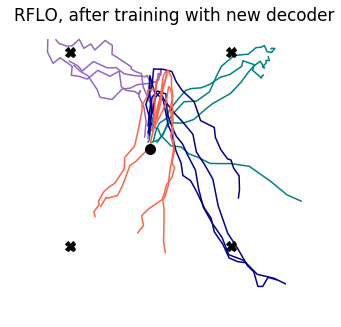

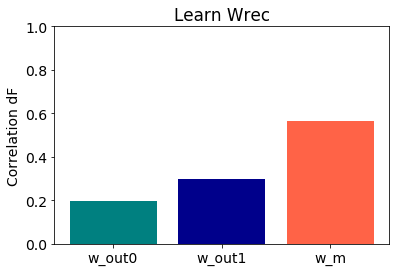

4it [00:00, 39.86it/s]

>> SCALE 10
M norm: 2.81	 M angle: 0.50, 25 iterations
w_out1 norm: 2.39	 w_out vs. w_out1 angle: 0.11
w_m norm: 2.81	 w_out1 vs. w_m angle: 0.50
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:07, 65.97it/s]
5000it [01:26, 57.50it/s]
500it [00:07, 70.45it/s]


AR early fit 0.984, late fit 0.983


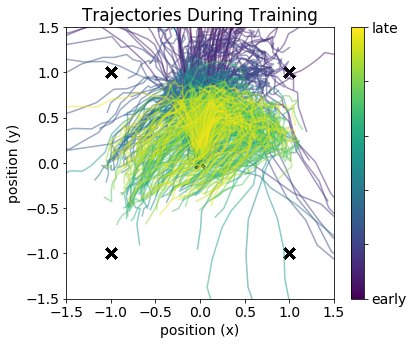

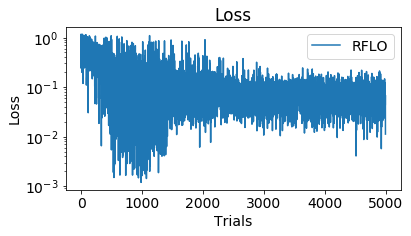

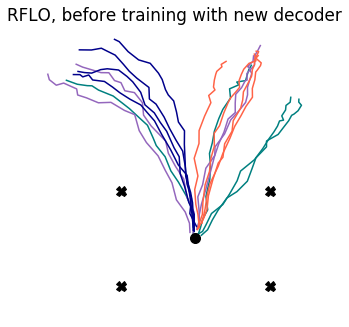

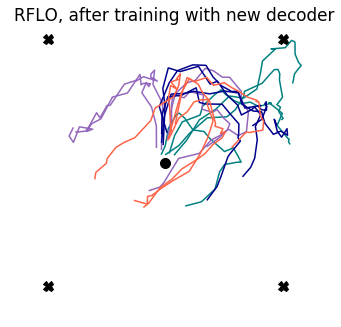

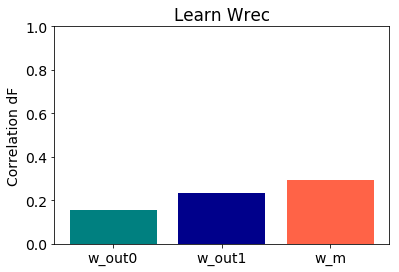

In [5]:
# Set RNN Parameters
params = RNNparams(n_in=4,n_rec=50,n_out=2,tau_rec=10,
               eta_in=0.1,eta_rec=0.1,eta_out=0.1,eta_fb=0.1,g_fb=2,
               sig_in=0.0,sig_rec=0.1,sig_out=0.01,sig_fb=0.01,
               velocity_transform=False, tau_vel = 0.8, dt_vel = 0.1,
               driving_feedback=True,
               rng=np.random.RandomState(72))
params.print_params()

# Initialize RNN
net0 = RNN(params)
sim0 = Simulation(net0)
rflo = RFLO(net0,apply_to=['w_rec','w_fb'],online=False)
sim0.run_session(n_trials=3000, tasks=[task1,task2,task3,task4], learn_alg=[rflo], probe_types=['loss'], plot=True, plot_freq=20)

fig0 = plot_trained_trajectories(sim=sim0, tasks=[task1,task2,task3,task4],title='Pretrain RFLO, train '+r'$W_{rec}$')






""" Average over multiple seeds """
seeds = [1776,1812,1918,1945]#,33,47,91,73,444,567,886,212]#,72,81,1973,1978,2002]
overlap = 0.5
n_change = 60
scales_w_fb = [0.5,1,2,5]
training_duration = 5000


stats = {}
stats['corr1'] = []
stats['corr2'] = []
stats['corr3'] = []

stats['corrcoef'] = []

stats['corr_w_fb_w_m'] = []
stats['corr_w_fb_w_out'] = []

stats['seeds'] = seeds
stats['overlap'] = overlap
stats['n_change'] = n_change
stats['scales_w_fb'] = scales_w_fb
stats['training_duration'] = training_duration
stats['frac_on'] = frac_on
stats['RNNparams'] = params

for seed in seeds:

    corr1_list = []
    corr2_list = []
    corr3_list = []

    corrcoef_list = []
    
    corr_w_fb_w_m = []
    corr_w_fb_w_out = []

    #for overlap,n_change in zip(overlaps,n_changes):
    """ loop over strength of w_fb """
    for scale in scales_w_fb:
        print('>> SCALE {}'.format(scale))
        
        """ w_out1 is chosen wrt w_fb and m (w_fb==w_m for simplicity) """
        w_out1 = choose_aligned_matrix(net0.w_fb.copy().T,n_change=n_change,overlap=overlap,rng=np.random.RandomState(seed),zero=False,tolerance=0.01,loop=1000)

        w_m = net0.w_fb.copy().T
        
        # confirm overlap between w_out1 and w_out
        norm, angle = return_norm_and_angle(net0.w_out,w_out1)
        print('\nw_out1 norm: {:.2f}'.format(norm) + '\t w_out vs. w_out1 angle: {:.2f}'.format(angle),end='')

        # confirm overlap between w_out1 and w_m
        norm, angle = return_norm_and_angle(w_out1,w_m)
        print('\nw_m norm: {:.2f}'.format(norm) + '\t w_out1 vs. w_m angle: {:.2f}'.format(angle),end='')

        # confirm overlap between w_out and w_m
        norm, angle = return_norm_and_angle(net0.w_out,w_m)
        print('\nw_m norm: {:.2f}'.format(norm) + '\t w_out vs. w_m angle: {:.2f}'.format(angle),end='')
        
        
        
        
        net1_pre = RNN(params)
        net1_pre.set_weights(w_in=net0.w_in.copy(), w_rec=net0.w_rec.copy(),w_fb = scale*net0.w_fb.copy())
        net1_pre.set_weights(w_out = w_out1)
        net1_pre.set_weights(w_m = net0.w_fb.copy())

        # unfortunately I need to make a different network to maintain integrity of pre and post simulations for plotting
        net1 = RNN(params)
        net1.set_weights(w_in=net0.w_in.copy(), w_rec=net0.w_rec.copy(),w_fb = scale*net0.w_fb.copy()) # scale driving feedback
        net1.set_weights(w_out = w_out1)
        net1.set_weights(w_m = net0.w_fb.copy()) # don't scale w_m...this would effectively scale the learning rate




        """ Track activity with new decoder, before training """

        sim1_pre = Simulation(net1_pre)
        trackvars = TrackVars(net1_pre,apply_to=[]) 
        sim1_pre.run_session(n_trials=500, tasks=[task1,task2,task3,task4], learn_alg=[trackvars], probe_types=['h','err'], plot=False, plot_freq=10)
        
        corr_w_fb_w_m.append(np.corrcoef(net1_pre.w_fb.copy().ravel(),net1_pre.w_m.copy().ravel())[0,1]) # w_fb and w_m both have dimensions (n_rec, n_out)
        corr_w_fb_w_out.append(np.corrcoef(net1_pre.w_fb.copy().ravel(),net1_pre.w_out.T.copy().ravel())[0,1]) # w_fb and w_m both have dimensions (n_rec, n_out)

        
        """ Train with new decoder """

        sim1_train = Simulation(net1)
        rflo = RFLO(net1,apply_to=['w_rec'],online=False)
        sim1_train.run_session(n_trials=training_duration, tasks=[task1,task2,task3,task4], learn_alg=[rflo], probe_types=['h','loss','err','pos'], plot=True, plot_freq=10)

        """ Track activity with new decoder, after training """
        net1_post = RNN(params)
        net1_post.set_weights(w_in=net1.w_in.copy(), w_rec=net1.w_rec.copy(),w_fb = scale*net0.w_fb.copy())
        net1_post.set_weights(w_out = net1.w_out)
        net1_post.set_weights(w_m = net0.w_fb.copy())

        sim1_post = Simulation(net1_post)
        trackvars = TrackVars(net1_post,apply_to=[]) 
        sim1_post.run_session(n_trials=500, tasks=[task1,task2,task3,task4], learn_alg=[trackvars], probe_types=['h','err'], plot=False, plot_freq=10)

        
        fig = plot_trained_trajectories(sim=sim1_pre, tasks=[task1,task2,task3,task4],title='RFLO, before training with new decoder')

        fig = plot_trained_trajectories(sim=sim1_post, tasks=[task1,task2,task3,task4],title='RFLO, after training with new decoder')
        
        
        """ Calculate F fields """
        F_early, score_early = flow_field_data(sim1_pre.session_probes['h'])
        F_late, score_late = flow_field_data(sim1_post.session_probes['h'])

        print('AR early fit {:.3f}, late fit {:.3f}'.format(score_early,score_late))

        Fdata = F_late - F_early

        # separate train and test data from sim1_train
        n_total = len(sim1_train.session_probes['h'])
        n_train = int(0.5 * n_total)
        idx_train = np.random.RandomState(1975+seed).choice(np.arange(0,n_total),size=n_train,replace=False).astype(int)
        idx_test = np.arange(0,n_total)[~idx_train].astype(int)

        h_train = np.asarray(sim1_train.session_probes['h'])[idx_train,:,:,:]
        err_train = np.asarray(sim1_train.session_probes['err'])[idx_train,:,:,:]
        pos_train = np.asarray(sim1_train.session_probes['pos'])[idx_train,:,:,:]

        
        Fpred_w_out = flow_field_predicted(net0.w_out,err_train,h_train)
        Fpred_w_out1 = flow_field_predicted(w_out1,err_train,h_train)
        Fpred_w_m = flow_field_predicted(w_m,err_train,h_train) # note w_m is not scaled here
        

        h_test = np.asarray(sim1_train.session_probes['h'])[idx_test,:,:,:]

        corr1 = calculate_flow_field_correlation(Fpred_w_out,Fdata,h_test) # could also sample sim_test
        corr1_list.append(corr1)

        corr2 = calculate_flow_field_correlation(Fpred_w_out1,Fdata,h_test) # could also sample sim_test
        corr2_list.append(corr2)

        corr3 = calculate_flow_field_correlation(Fpred_w_m,Fdata,h_test) # could also sample sim_test
        corr3_list.append(corr3)
        

        
        # correlation after learning
        corr_w_fb_w_m.append(np.corrcoef(net1.w_fb.copy().ravel(),net1.w_m.copy().ravel())[0,1]) # w_fb and w_m both have dimensions (n_rec, n_out)
        corr_w_fb_w_out.append(np.corrcoef(net1.w_fb.copy().ravel(),net1.w_out.T.copy().ravel())[0,1]) # w_fb and w_m both have dimensions (n_rec, n_out)

        
        fig,ax = plt.subplots(1,1)
       
        plt.bar([0,1,2],[corr1,corr2,corr3],tick_label=['w_out0','w_out1','w_m'],color=['teal','darkblue','tomato'])

        plt.ylim(top=1)
        plt.ylabel('Correlation dF')
        plt.title('Learn Wrec')
        plt.show()
        
        
        
        
        
    # update
    stats['corr1'].append(corr1_list)
    stats['corr2'].append(corr2_list)
    stats['corr3'].append(corr3_list)

    #stats['corrcoef'].append(corrcoef_list)

    
    stats['corr_w_fb_w_m'].append(corr_w_fb_w_m)
    stats['corr_w_fb_w_out'].append(corr_w_fb_w_out)


In [6]:
""" save stats """
""" save dict with unique name """
stats_rflo_scale_wfb = stats

save = True

if save:
    
    with open(folder+'stats_rflo_scale_wfb.pickle', 'wb') as handle:
        pickle.dump(stats_rflo_scale_wfb, handle, protocol=pickle.HIGHEST_PROTOCOL)



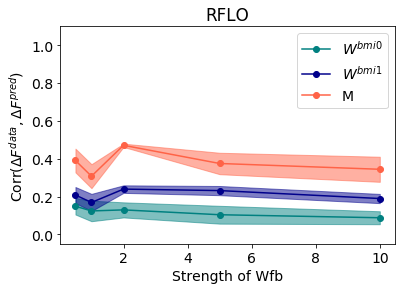

In [7]:
""" Plot scaling of W_fb"""

save = False
paper = False

x = scales_w_fb
n_samples = np.asarray(stats['corr1']).shape[0]
mn1 = np.mean(np.asarray(stats['corr1']).T,axis=1)
mn2 = np.mean(np.asarray(stats['corr2']).T,axis=1)
mn3 = np.mean(np.asarray(stats['corr3']).T,axis=1)
std1 = np.std(np.asarray(stats['corr1']).T,axis=1)
std2 = np.std(np.asarray(stats['corr2']).T,axis=1)
std3 = np.std(np.asarray(stats['corr3']).T,axis=1)
sem1 = np.std(np.asarray(stats['corr1']).T,axis=1)/np.sqrt(n_samples)
sem2 = np.std(np.asarray(stats['corr2']).T,axis=1)/np.sqrt(n_samples)
sem3 = np.std(np.asarray(stats['corr3']).T,axis=1)/np.sqrt(n_samples)

fig,ax = plt.subplots(1,1)


plt.plot(x,mn1,'o-',color='teal',label=r'$W^{bmi0}$')
plt.plot(x,mn2,'o-',color='darkblue',label=r'$W^{bmi1}$')
plt.plot(x,mn3,'o-',color='tomato',label='M')
plt.fill_between(x,mn1-sem1,mn1+sem1,alpha=0.5,color='teal')
plt.fill_between(x,mn2-sem2,mn2+sem2,alpha=0.5,color='darkblue')
plt.fill_between(x,mn3-sem3,mn3+sem3,alpha=0.5,color='tomato')



plt.title('RFLO')
plt.ylabel('Corr('+r'$\Delta F^{data},\Delta F^{pred})$')
plt.xlabel('Strength of Wfb')
plt.ylim([-0.05,1.1])
#plt.xlim([-50,1400])
plt.legend()

if paper:
    fig,ax = paper_format(fig=fig,ax=ax,xlabels=None,ylabels=[0,0.2,0.4,0.6,0.8,1],linewidth=2,ylim=[-0.05,1],figsize=(2.25,3))

plt.show()

if save:
    fig.savefig(folder+'rflo-scale_w_fb.pdf')

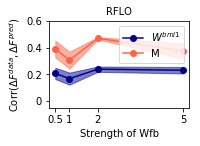

In [14]:
""" Plot scaling of W_fb"""

save = False
paper = True

x = scales_w_fb[:-1]
n_samples = np.asarray(stats['corr1']).shape[0]
mn2 = np.mean(np.asarray(stats['corr2']).T,axis=1)[:-1]
mn3 = np.mean(np.asarray(stats['corr3']).T,axis=1)[:-1]
std2 = np.std(np.asarray(stats['corr2']).T,axis=1)[:-1]
std3 = np.std(np.asarray(stats['corr3']).T,axis=1)[:-1]
sem2 = std2/np.sqrt(n_samples)
sem3 = std3/np.sqrt(n_samples)

fig,ax = plt.subplots(1,1)


plt.plot(x,mn2,'o-',color='darkblue',label=r'$W^{bmi1}$')
plt.plot(x,mn3,'o-',color='tomato',label='M')
plt.fill_between(x,mn2-sem2,mn2+sem2,alpha=0.5,color='darkblue')
plt.fill_between(x,mn3-sem3,mn3+sem3,alpha=0.5,color='tomato')



plt.title('RFLO')
plt.ylabel('Corr('+r'$\Delta F^{data},\Delta F^{pred})$')
plt.xlabel('Strength of Wfb')
plt.ylim([-0.05,1.1])
#plt.xlim([-50,1400])
plt.legend()

if paper:
    fig,ax = paper_format(fig=fig,ax=ax,xlabels=[0.5,1,2,5],ylabels=[0,0.2,0.4,0.6,0.8,1],linewidth=2,ylim=[-0.05,0.6],figsize=(2.25,3),labelsize=10)

plt.show()

if save:
    fig.savefig(folder+'rflo-scale_w_fb-v2.pdf')

# Part 2 - Scale Driving Feedback, REINFORCE

Here are some hyperparameters that work nicely

3it [00:00, 27.87it/s]

n_in: 4
n_rec: 50
n_out: 2
sig_in: 0.0
sig_rec: 0.1
sig_out: 0.01
tau_rec: 10
dt: 1.0
eta_in: 0.1
eta_rec: 0.1
eta_out: 0.25
g_in: 2.0
g_rec: 1.5
g_out: 2.0
g_fb: 2
driving_feedback: True
eta_fb: 0.1
sig_fb: 0.01
feedback_signal: position
velocity_transform: False
tau_vel: 0.8
dt_vel: 0.1
sig_rec_dim: None
eta_m: None
sig_m: None
lam_m: None
rng: <mtrand.RandomState object at 0x7f9a0394acf0>


3000it [00:45, 66.33it/s]
10it [00:00, 95.74it/s]

>> SCALE 0.5
M norm: 2.82	 M angle: 0.49, 1 iterations
w_out1 norm: 2.29	 w_out vs. w_out1 angle: 0.20
w_m norm: 2.82	 w_out1 vs. w_m angle: 0.49
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:05, 99.63it/s] 
10000it [02:23, 69.49it/s]
500it [00:04, 102.97it/s]


AR early fit 0.947, late fit 0.972


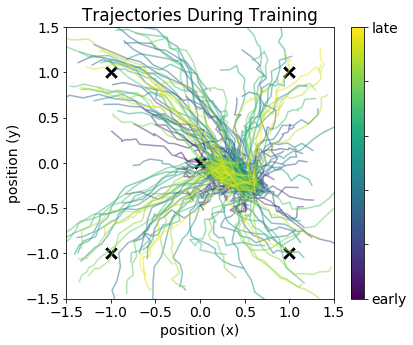

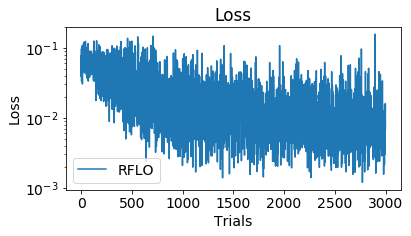

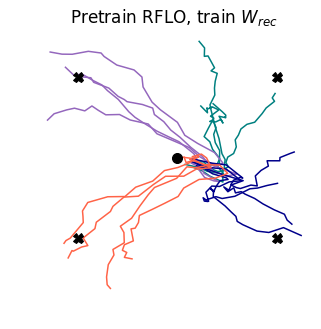

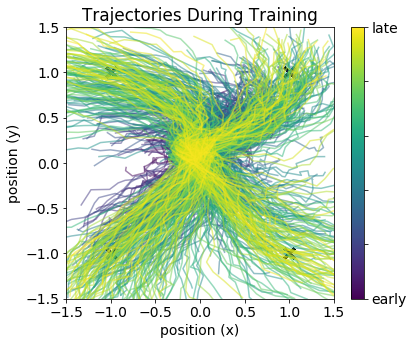

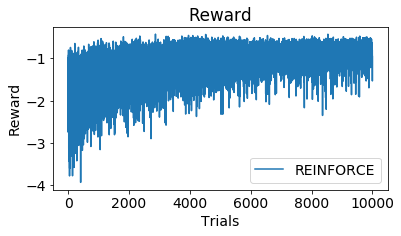

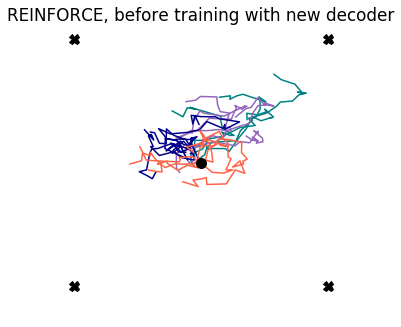

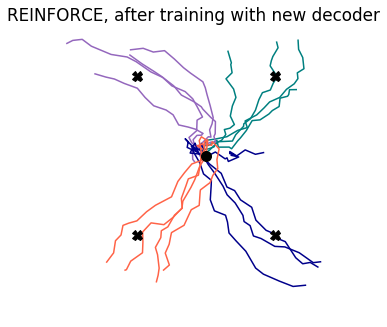

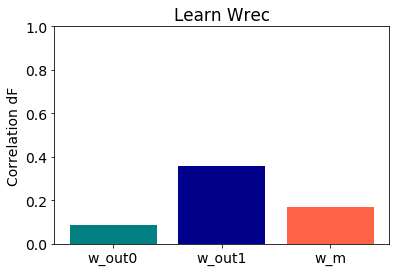

11it [00:00, 103.93it/s]

>> SCALE 1
M norm: 2.82	 M angle: 0.49, 1 iterations
w_out1 norm: 2.29	 w_out vs. w_out1 angle: 0.20
w_m norm: 2.82	 w_out1 vs. w_m angle: 0.49
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:04, 112.29it/s]
10000it [02:44, 60.77it/s]
500it [00:04, 111.22it/s]


AR early fit 0.953, late fit 0.975


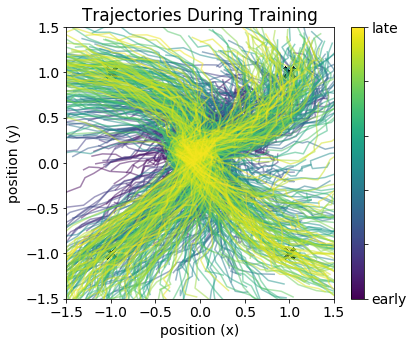

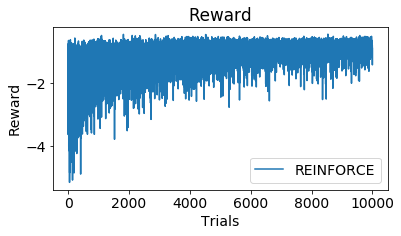

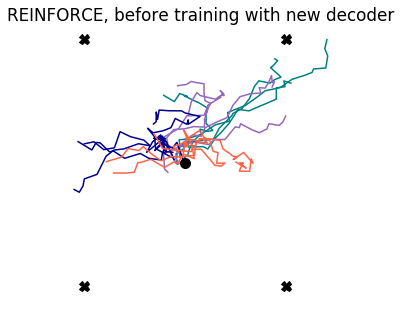

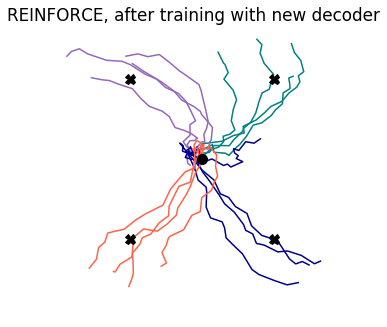

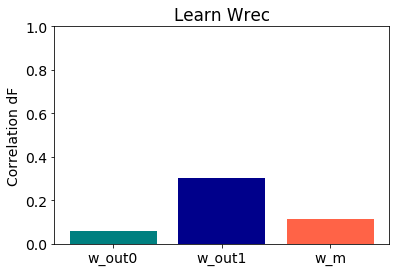

11it [00:00, 107.21it/s]

>> SCALE 2
M norm: 2.82	 M angle: 0.49, 1 iterations
w_out1 norm: 2.29	 w_out vs. w_out1 angle: 0.20
w_m norm: 2.82	 w_out1 vs. w_m angle: 0.49
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:04, 113.08it/s]
10000it [02:06, 79.16it/s]
500it [00:04, 114.27it/s]


AR early fit 0.974, late fit 0.983


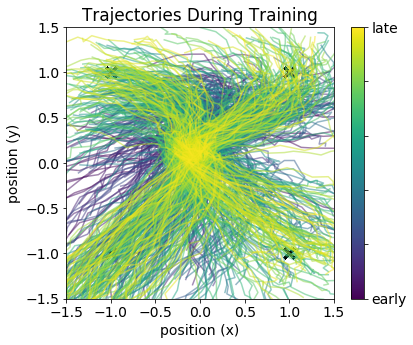

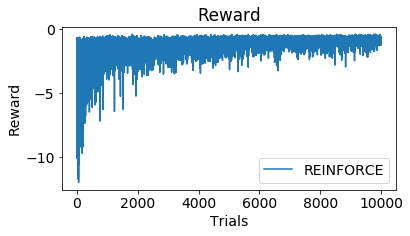

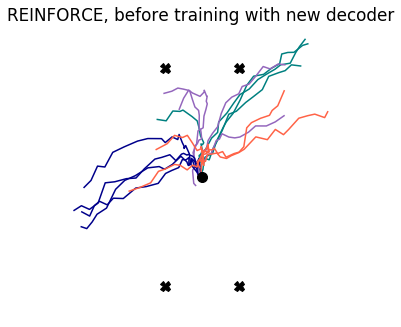

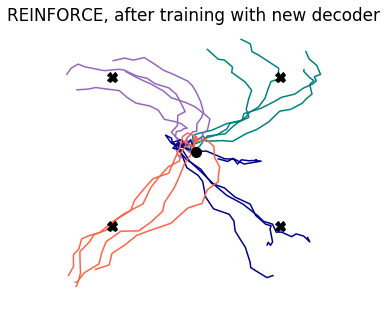

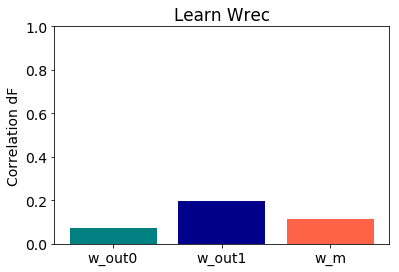

10it [00:00, 93.95it/s]

>> SCALE 5
M norm: 2.82	 M angle: 0.49, 1 iterations
w_out1 norm: 2.29	 w_out vs. w_out1 angle: 0.20
w_m norm: 2.82	 w_out1 vs. w_m angle: 0.49
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:04, 112.73it/s]
10000it [02:16, 73.12it/s]
500it [00:05, 87.21it/s]


AR early fit 0.989, late fit 0.983


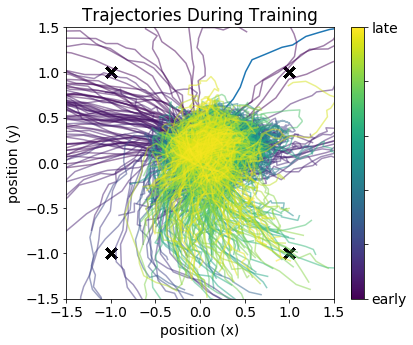

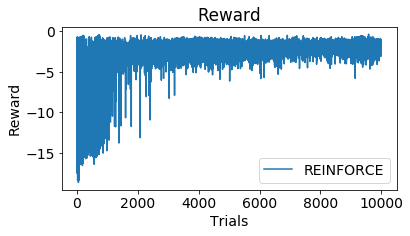

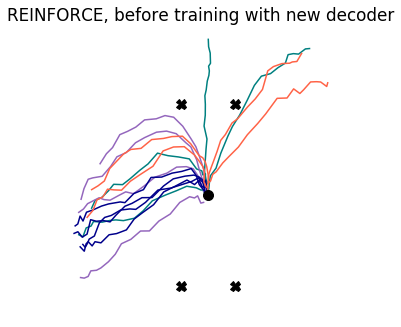

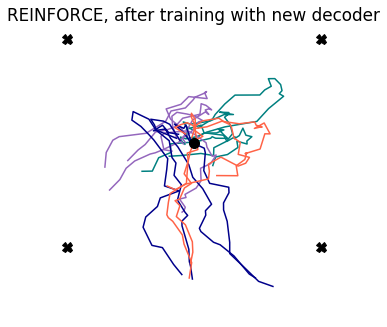

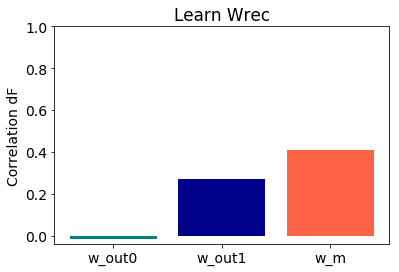

10it [00:00, 96.78it/s]

>> SCALE 0.5
M norm: 2.81	 M angle: 0.50, 16 iterations
w_out1 norm: 2.28	 w_out vs. w_out1 angle: 0.19
w_m norm: 2.81	 w_out1 vs. w_m angle: 0.50
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:04, 98.22it/s]
10000it [02:02, 81.38it/s]
500it [00:04, 115.73it/s]


AR early fit 0.950, late fit 0.975


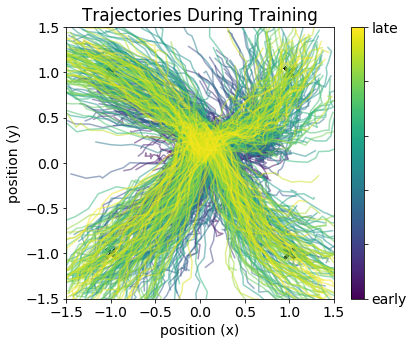

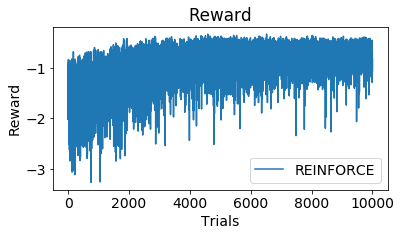

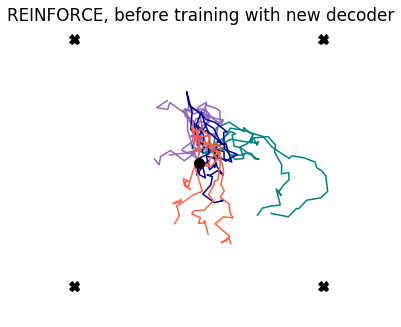

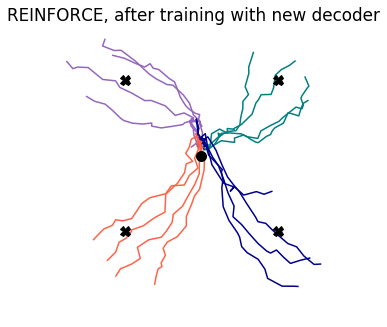

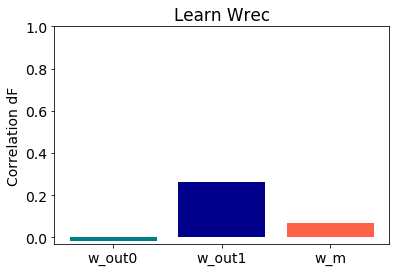

10it [00:00, 96.20it/s]

>> SCALE 1
M norm: 2.81	 M angle: 0.50, 16 iterations
w_out1 norm: 2.28	 w_out vs. w_out1 angle: 0.19
w_m norm: 2.81	 w_out1 vs. w_m angle: 0.50
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:04, 113.49it/s]
10000it [02:02, 81.53it/s]
500it [00:04, 113.93it/s]


AR early fit 0.959, late fit 0.978


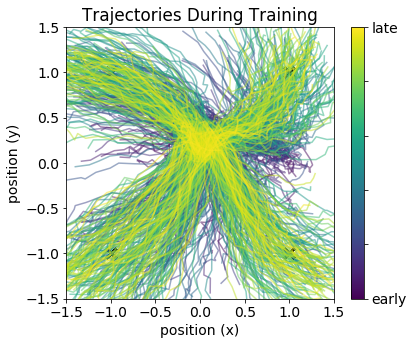

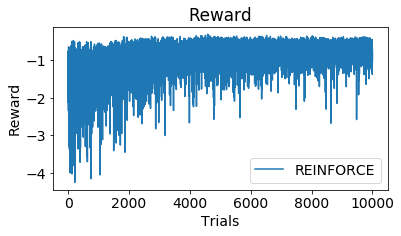

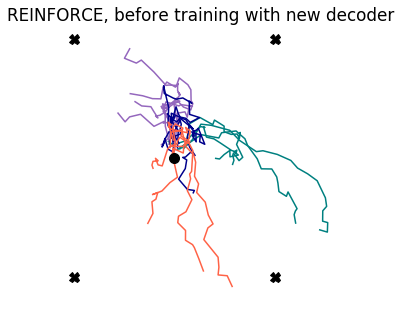

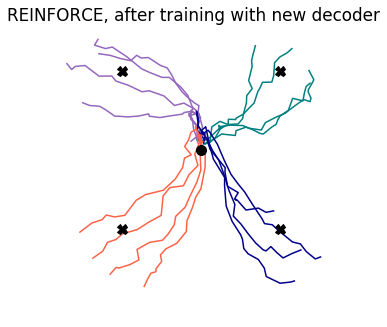

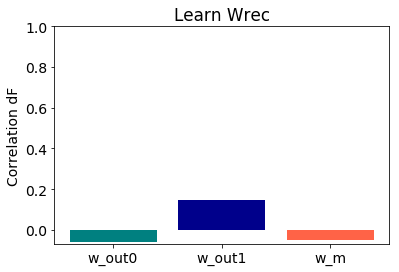

8it [00:00, 75.00it/s]

>> SCALE 2
M norm: 2.81	 M angle: 0.50, 16 iterations
w_out1 norm: 2.28	 w_out vs. w_out1 angle: 0.19
w_m norm: 2.81	 w_out1 vs. w_m angle: 0.50
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:05, 87.96it/s]
10000it [02:32, 44.12it/s]
500it [00:05, 91.77it/s] 


AR early fit 0.976, late fit 0.983


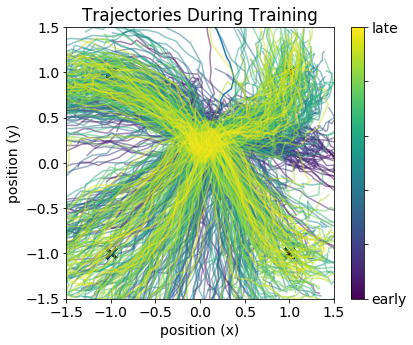

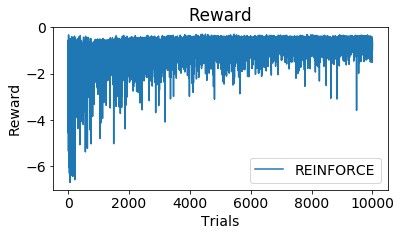

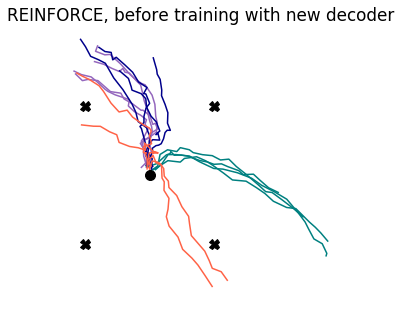

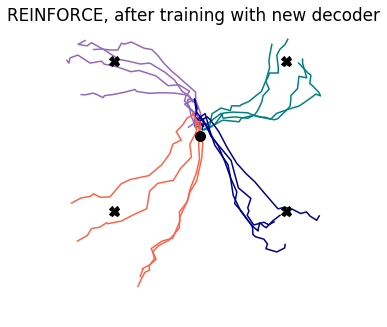

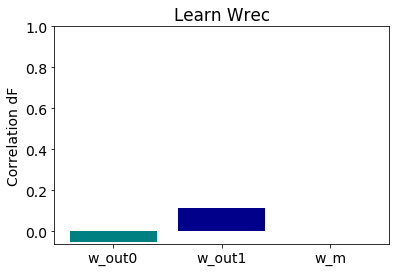

11it [00:00, 99.09it/s]

>> SCALE 5
M norm: 2.81	 M angle: 0.50, 16 iterations
w_out1 norm: 2.28	 w_out vs. w_out1 angle: 0.19
w_m norm: 2.81	 w_out1 vs. w_m angle: 0.50
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:05, 91.88it/s]
10000it [02:22, 70.23it/s]
500it [00:04, 110.37it/s]


AR early fit 0.987, late fit 0.989


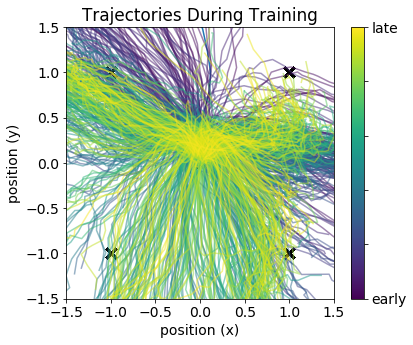

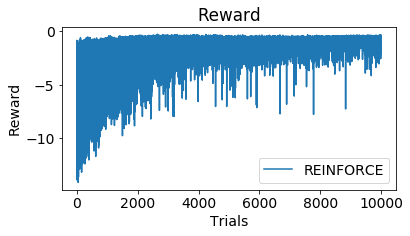

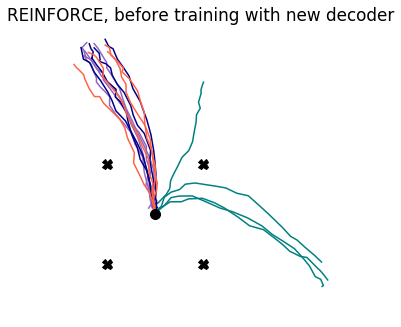

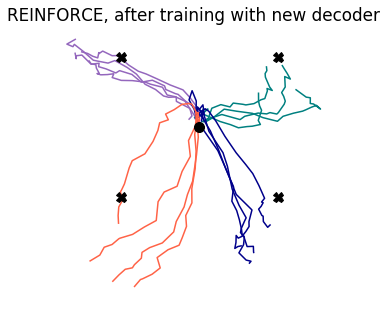

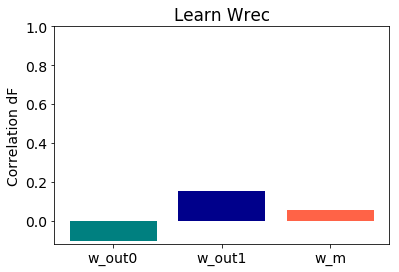

7it [00:00, 62.74it/s]

>> SCALE 0.5
M norm: 2.82	 M angle: 0.49, 56 iterations
w_out1 norm: 2.16	 w_out vs. w_out1 angle: 0.31
w_m norm: 2.82	 w_out1 vs. w_m angle: 0.49
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:05, 84.97it/s]
10000it [02:29, 66.00it/s]
500it [00:05, 90.03it/s]


AR early fit 0.950, late fit 0.971


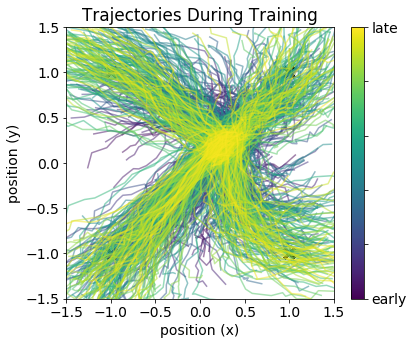

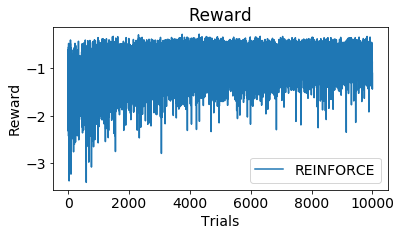

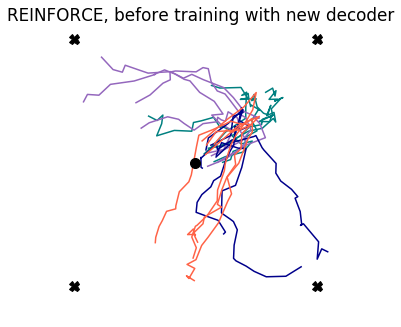

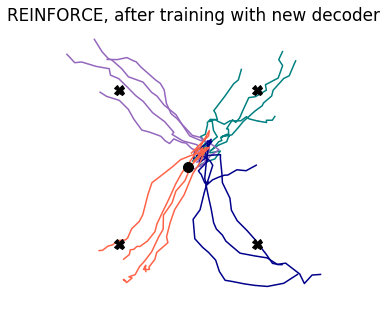

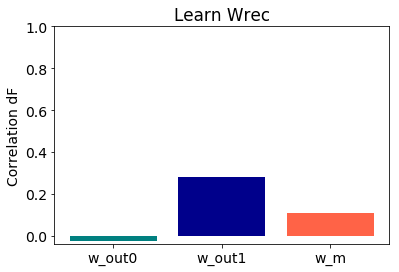

9it [00:00, 86.98it/s]

>> SCALE 1
M norm: 2.82	 M angle: 0.49, 56 iterations
w_out1 norm: 2.16	 w_out vs. w_out1 angle: 0.31
w_m norm: 2.82	 w_out1 vs. w_m angle: 0.49
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:04, 112.12it/s]
10000it [02:02, 81.70it/s]
500it [00:04, 111.41it/s]


AR early fit 0.958, late fit 0.974


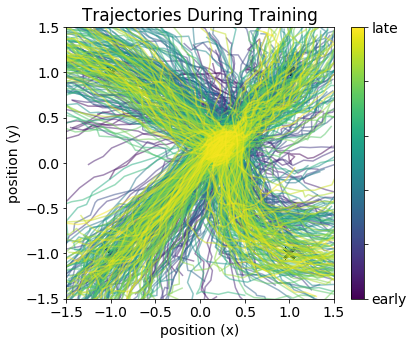

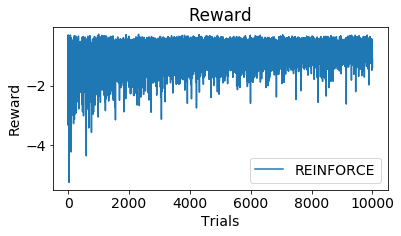

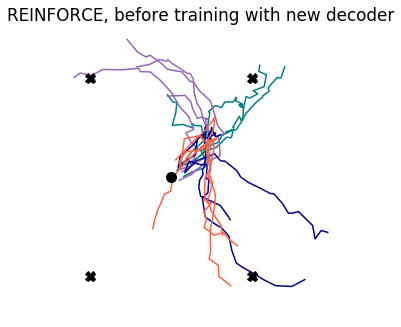

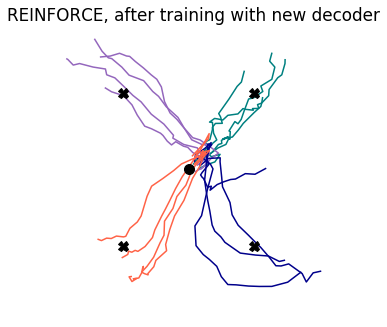

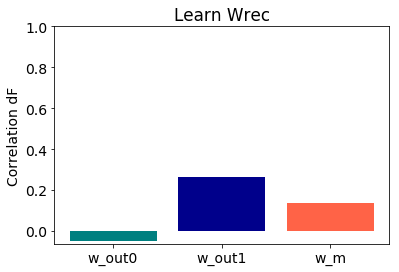

9it [00:00, 84.72it/s]

>> SCALE 2
M norm: 2.82	 M angle: 0.49, 56 iterations
w_out1 norm: 2.16	 w_out vs. w_out1 angle: 0.31
w_m norm: 2.82	 w_out1 vs. w_m angle: 0.49
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:04, 114.09it/s]
10000it [02:05, 79.70it/s]
500it [00:04, 115.20it/s]


AR early fit 0.968, late fit 0.981


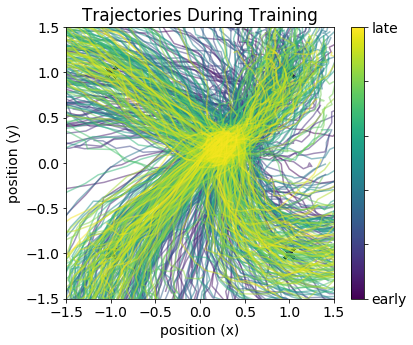

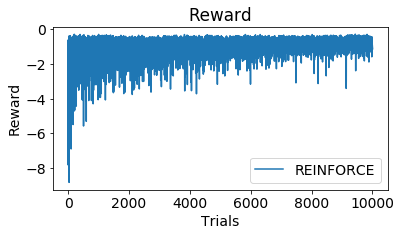

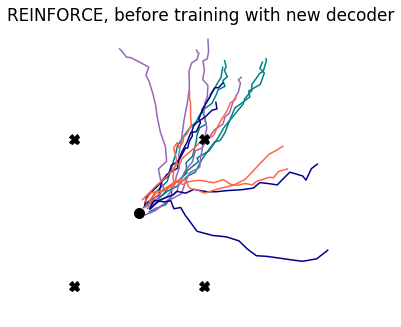

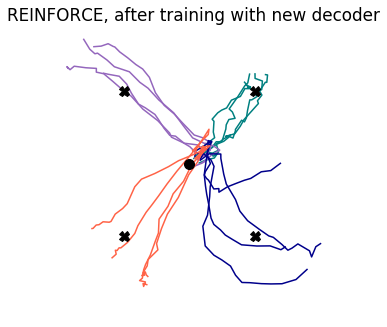

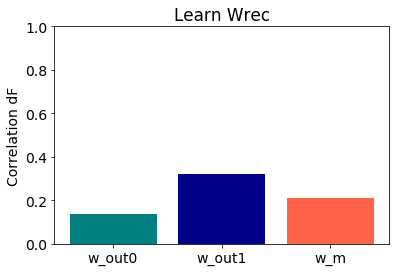

9it [00:00, 89.66it/s]

>> SCALE 5
M norm: 2.82	 M angle: 0.49, 56 iterations
w_out1 norm: 2.16	 w_out vs. w_out1 angle: 0.31
w_m norm: 2.82	 w_out1 vs. w_m angle: 0.49
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:04, 113.87it/s]
10000it [02:04, 80.37it/s]
500it [00:04, 114.13it/s]


AR early fit 0.979, late fit 0.984


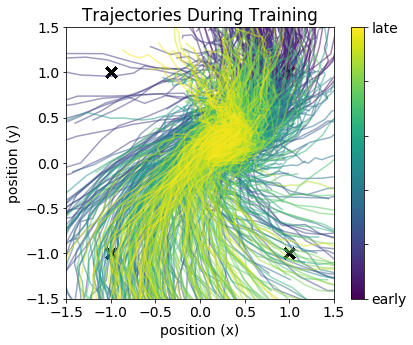

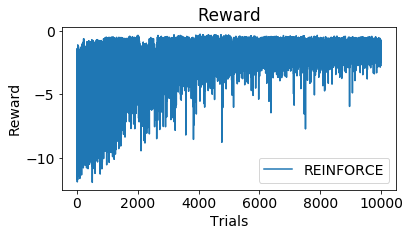

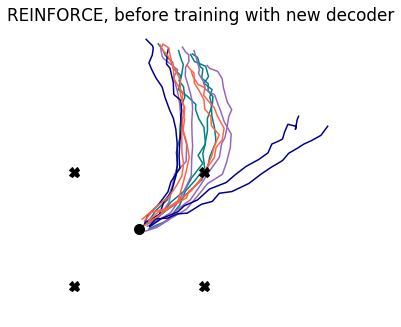

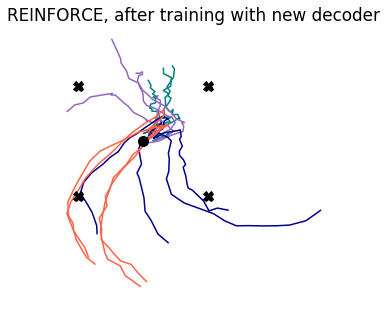

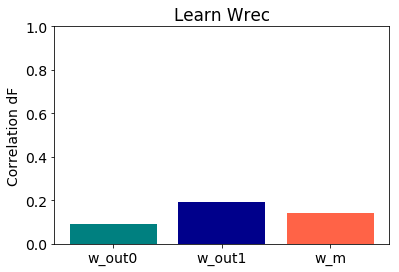

11it [00:00, 108.62it/s]

>> SCALE 0.5
M norm: 2.81	 M angle: 0.50, 25 iterations
w_out1 norm: 2.39	 w_out vs. w_out1 angle: 0.11
w_m norm: 2.81	 w_out1 vs. w_m angle: 0.50
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:04, 115.70it/s]
10000it [02:03, 81.11it/s]
500it [00:04, 114.55it/s]


AR early fit 0.946, late fit 0.970


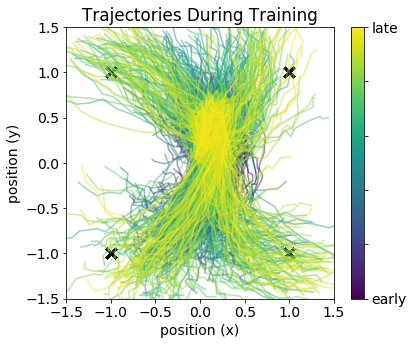

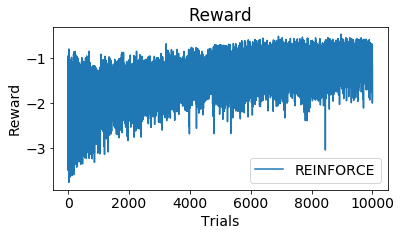

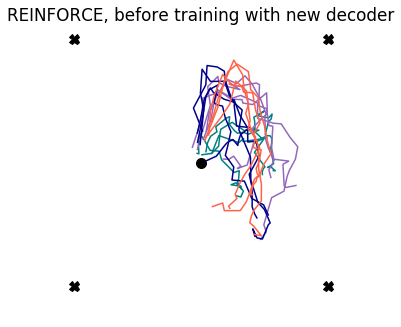

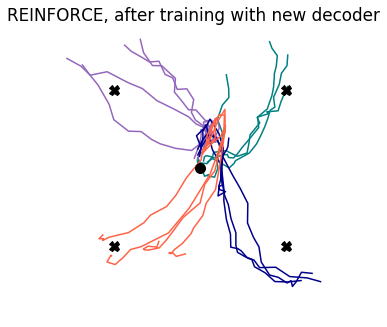

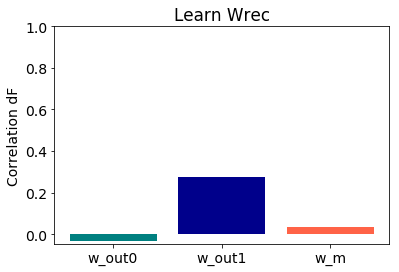

10it [00:00, 99.52it/s]

>> SCALE 1
M norm: 2.81	 M angle: 0.50, 25 iterations
w_out1 norm: 2.39	 w_out vs. w_out1 angle: 0.11
w_m norm: 2.81	 w_out1 vs. w_m angle: 0.50
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:04, 111.17it/s]
10000it [02:04, 80.63it/s]
500it [00:04, 117.93it/s]


AR early fit 0.951, late fit 0.974


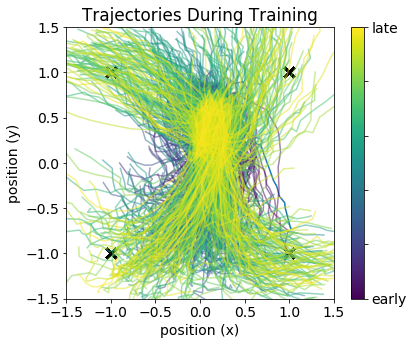

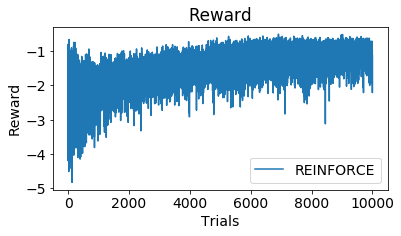

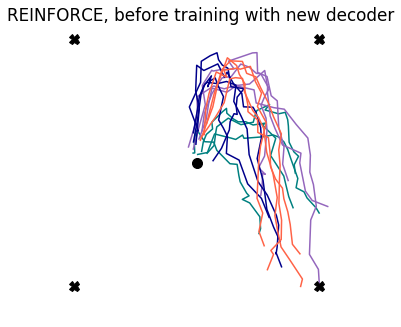

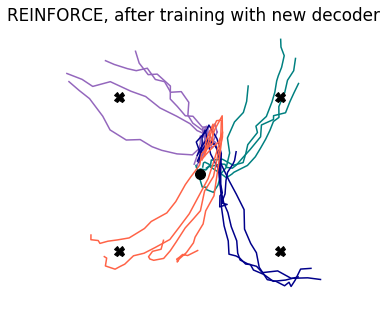

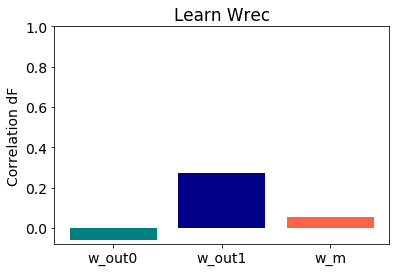

9it [00:00, 86.63it/s]

>> SCALE 2
M norm: 2.81	 M angle: 0.50, 25 iterations
w_out1 norm: 2.39	 w_out vs. w_out1 angle: 0.11
w_m norm: 2.81	 w_out1 vs. w_m angle: 0.50
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:04, 113.17it/s]
10000it [02:02, 81.33it/s]
500it [00:04, 115.00it/s]


AR early fit 0.966, late fit 0.978


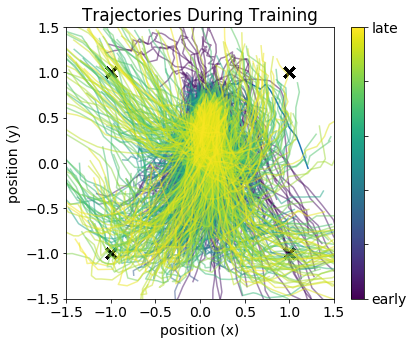

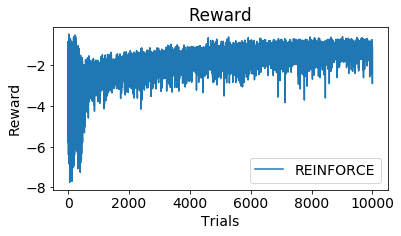

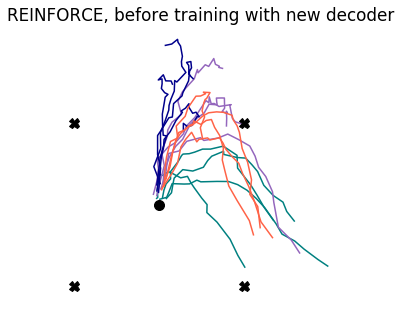

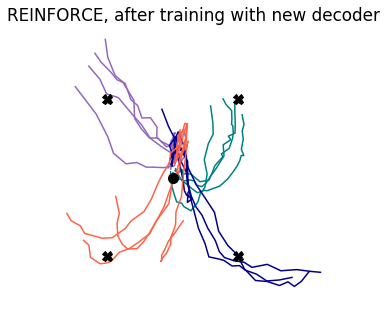

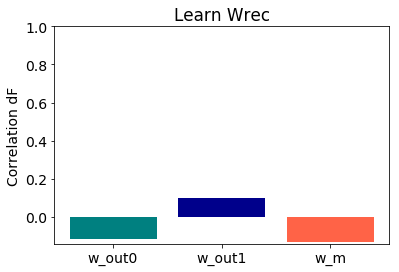

10it [00:00, 96.68it/s]

>> SCALE 5
M norm: 2.81	 M angle: 0.50, 25 iterations
w_out1 norm: 2.39	 w_out vs. w_out1 angle: 0.11
w_m norm: 2.81	 w_out1 vs. w_m angle: 0.50
w_m norm: 3.14	 w_out vs. w_m angle: 0.30

500it [00:04, 102.96it/s]
10000it [02:02, 81.70it/s]
500it [00:04, 111.39it/s]


AR early fit 0.979, late fit 0.981


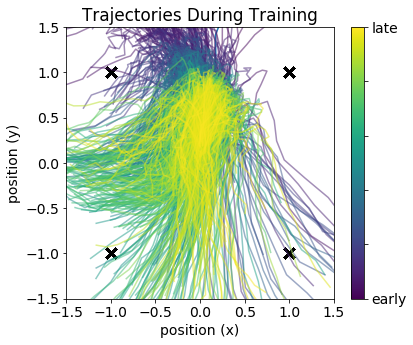

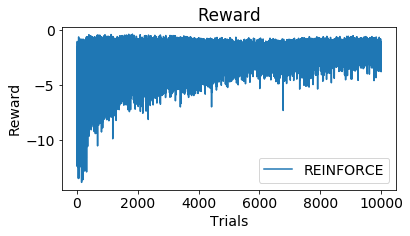

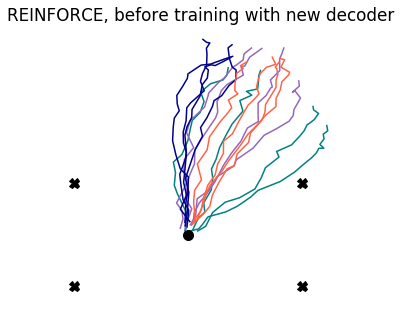

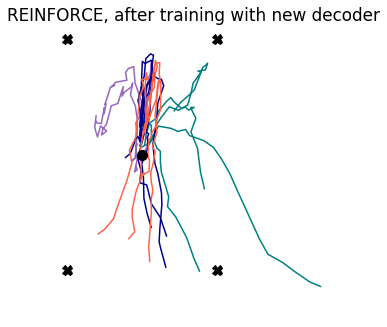

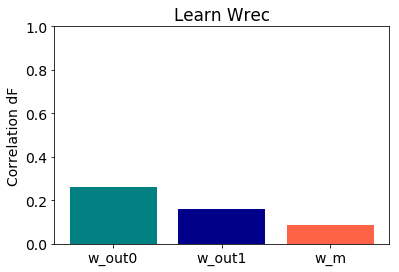

In [15]:
# Set RNN Parameters
params = RNNparams(n_in=4,n_rec=50,n_out=2,tau_rec=10,
               eta_in=0.1,eta_rec=0.1,eta_out=0.25,eta_fb=0.1,g_fb=2,
               sig_in=0.0,sig_rec=0.1,sig_out=0.01,sig_fb=0.01,
               velocity_transform=False, tau_vel = 0.8, dt_vel = 0.1,
               driving_feedback=True,
               rng=np.random.RandomState(72))
params.print_params()

# Initialize RNN
net0 = RNN(params)
sim0 = Simulation(net0)
rflo = RFLO(net0,apply_to=['w_rec','w_fb'],online=False)
sim0.run_session(n_trials=3000, tasks=[task1,task2,task3,task4], learn_alg=[rflo], probe_types=['loss'], plot=True, plot_freq=20)

fig0 = plot_trained_trajectories(sim=sim0, tasks=[task1,task2,task3,task4],title='Pretrain RFLO, train '+r'$W_{rec}$')






""" Average over multiple seeds """
seeds = [1776,1812,1918,1945]#,33,47,91,73,444,567,886,212]#,72,81,1973,1978,2002]
overlap = 0.5
n_change = 60
scales_w_fb = [0.5,1,2,5]
training_duration = 10000




stats = {}
stats['corr1'] = []
stats['corr2'] = []
stats['corr3'] = []

stats['corrcoef'] = []

stats['corr_w_fb_w_m'] = []
stats['corr_w_fb_w_out'] = []

stats['seeds'] = seeds
stats['overlap'] = overlap
stats['n_change'] = n_change
stats['scales_w_fb'] = scales_w_fb
stats['training_duration'] = training_duration
stats['frac_on'] = frac_on
stats['RNNparams'] = params

for seed in seeds:

    corr1_list = []
    corr2_list = []
    corr3_list = []

    corrcoef_list = []
    
    corr_w_fb_w_m = []
    corr_w_fb_w_out = []

    #for overlap,n_change in zip(overlaps,n_changes):
    """ loop over strength of w_fb """
    for scale in scales_w_fb:
        print('>> SCALE {}'.format(scale))
        
        """ w_out1 is chosen wrt w_fb and m (w_fb==w_m for simplicity) """
        w_out1 = choose_aligned_matrix(net0.w_fb.copy().T,n_change=n_change,overlap=overlap,rng=np.random.RandomState(seed),zero=False,tolerance=0.01,loop=1000)

        w_m = net0.w_fb.copy().T
        
        # confirm overlap between w_out1 and w_out
        norm, angle = return_norm_and_angle(net0.w_out,w_out1)
        print('\nw_out1 norm: {:.2f}'.format(norm) + '\t w_out vs. w_out1 angle: {:.2f}'.format(angle),end='')

        # confirm overlap between w_out1 and w_m
        norm, angle = return_norm_and_angle(w_out1,w_m)
        print('\nw_m norm: {:.2f}'.format(norm) + '\t w_out1 vs. w_m angle: {:.2f}'.format(angle),end='')

        # confirm overlap between w_out and w_m
        norm, angle = return_norm_and_angle(net0.w_out,w_m)
        print('\nw_m norm: {:.2f}'.format(norm) + '\t w_out vs. w_m angle: {:.2f}'.format(angle),end='')
        
        
        
        
        net1_pre = RNN(params)
        net1_pre.set_weights(w_in=net0.w_in.copy(), w_rec=net0.w_rec.copy(),w_fb = scale*net0.w_fb.copy())
        net1_pre.set_weights(w_out = w_out1)
        net1_pre.set_weights(w_m = net0.w_fb.copy())

        # unfortunately I need to make a different network to maintain integrity of pre and post simulations for plotting
        net1 = RNN(params)
        net1.set_weights(w_in=net0.w_in.copy(), w_rec=net0.w_rec.copy(),w_fb = scale*net0.w_fb.copy())
        net1.set_weights(w_out = w_out1)
        net1.set_weights(w_m = net0.w_fb.copy())




        """ Track activity with new decoder, before training """

        sim1_pre = Simulation(net1_pre)
        trackvars = TrackVars(net1_pre,apply_to=[]) 
        sim1_pre.run_session(n_trials=500, tasks=[task1,task2,task3,task4], learn_alg=[trackvars], probe_types=['h','err'], plot=False, plot_freq=10)
        #fig = plot_trained_trajectories(sim=sim1_pre, tasks=[task1,task2,task3,task4],title='RFLO, before training with new decoder')

        
        corr_w_fb_w_m.append(np.corrcoef(net1_pre.w_fb.copy().ravel(),net1_pre.w_m.copy().ravel())[0,1]) # w_fb and w_m both have dimensions (n_rec, n_out)
        corr_w_fb_w_out.append(np.corrcoef(net1_pre.w_fb.copy().ravel(),net1_pre.w_out.T.copy().ravel())[0,1]) # w_fb and w_m both have dimensions (n_rec, n_out)

        
        """ Train with new decoder """

        sim1_train = Simulation(net1)
        reinforce = REINFORCE(net1,apply_to=['w_rec'],online=False,tau_reward=5)
        sim1_train.run_session(n_trials=training_duration, tasks=[task1,task2,task3,task4], learn_alg=[reinforce], probe_types=['h','reward','err','pos'], plot=True, plot_freq=10)

        """ Track activity with new decoder, after training """
        net1_post = RNN(params)
        net1_post.set_weights(w_in=net1.w_in.copy(), w_rec=net1.w_rec.copy(),w_fb = scale*net0.w_fb.copy())
        net1_post.set_weights(w_out = net1.w_out)
        net1_post.set_weights(w_m = net0.w_fb.copy())

        sim1_post = Simulation(net1_post)
        trackvars = TrackVars(net1_post,apply_to=[]) 
        sim1_post.run_session(n_trials=500, tasks=[task1,task2,task3,task4], learn_alg=[trackvars], probe_types=['h','err'], plot=False, plot_freq=10)

        
        fig = plot_trained_trajectories(sim=sim1_pre, tasks=[task1,task2,task3,task4],title='REINFORCE, before training with new decoder')

        fig = plot_trained_trajectories(sim=sim1_post, tasks=[task1,task2,task3,task4],title='REINFORCE, after training with new decoder')
        
        
        """ Calculate F fields """
        F_early, score_early = flow_field_data(sim1_pre.session_probes['h'])
        F_late, score_late = flow_field_data(sim1_post.session_probes['h'])

        print('AR early fit {:.3f}, late fit {:.3f}'.format(score_early,score_late))

        Fdata = F_late - F_early

        # separate train and test data from sim1_train
        n_total = len(sim1_train.session_probes['h'])
        n_train = int(0.5 * n_total)
        idx_train = np.random.RandomState(1975+seed).choice(np.arange(0,n_total),size=n_train,replace=False).astype(int)
        idx_test = np.arange(0,n_total)[~idx_train].astype(int)

        h_train = np.asarray(sim1_train.session_probes['h'])[idx_train,:,:,:]
        err_train = np.asarray(sim1_train.session_probes['err'])[idx_train,:,:,:]
        pos_train = np.asarray(sim1_train.session_probes['pos'])[idx_train,:,:,:]

        
        Fpred_w_out = flow_field_predicted(net0.w_out,err_train,h_train)
        Fpred_w_out1 = flow_field_predicted(w_out1,err_train,h_train)
        Fpred_w_m = flow_field_predicted(w_m,err_train,h_train)
        

        h_test = np.asarray(sim1_train.session_probes['h'])[idx_test,:,:,:]

        corr1 = calculate_flow_field_correlation(Fpred_w_out,Fdata,h_test) # could also sample sim_test
        corr1_list.append(corr1)

        corr2 = calculate_flow_field_correlation(Fpred_w_out1,Fdata,h_test) # could also sample sim_test
        corr2_list.append(corr2)

        corr3 = calculate_flow_field_correlation(Fpred_w_m,Fdata,h_test) # could also sample sim_test
        corr3_list.append(corr3)
        

        
        # correlation after learning
        corr_w_fb_w_m.append(np.corrcoef(net1.w_fb.copy().ravel(),net1.w_m.copy().ravel())[0,1]) # w_fb and w_m both have dimensions (n_rec, n_out)
        corr_w_fb_w_out.append(np.corrcoef(net1.w_fb.copy().ravel(),net1.w_out.T.copy().ravel())[0,1]) # w_fb and w_m both have dimensions (n_rec, n_out)

        
        fig,ax = plt.subplots(1,1)
       
        plt.bar([0,1,2],[corr1,corr2,corr3],tick_label=['w_out0','w_out1','w_m'],color=['teal','darkblue','tomato'])

        plt.ylim(top=1)
        plt.ylabel('Correlation dF')
        plt.title('Learn Wrec')
        plt.show()
        
        
        
        
        
    # update
    stats['corr1'].append(corr1_list)
    stats['corr2'].append(corr2_list)
    stats['corr3'].append(corr3_list)

    #stats['corrcoef'].append(corrcoef_list)

    
    stats['corr_w_fb_w_m'].append(corr_w_fb_w_m)
    stats['corr_w_fb_w_out'].append(corr_w_fb_w_out)


In [16]:
""" save stats """
stats_reinforce_scale_wfb = stats

save = True

if save:
    
    with open(folder+'stats_reinforce_scale_wfb.pickle', 'wb') as handle:
        pickle.dump(stats_reinforce_scale_wfb, handle, protocol=pickle.HIGHEST_PROTOCOL)



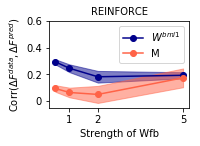

In [18]:
""" Plot scaling of W_fb"""

save = True
paper = True

x = scales_w_fb
n_samples = np.asarray(stats['corr1']).shape[0]
mn2 = np.mean(np.asarray(stats['corr2']).T,axis=1)
mn3 = np.mean(np.asarray(stats['corr3']).T,axis=1)
std2 = np.std(np.asarray(stats['corr2']).T,axis=1)
std3 = np.std(np.asarray(stats['corr3']).T,axis=1)
sem2 = np.std(np.asarray(stats['corr2']).T,axis=1)/np.sqrt(n_samples)
sem3 = np.std(np.asarray(stats['corr3']).T,axis=1)/np.sqrt(n_samples)

fig,ax = plt.subplots(1,1)


plt.plot(x,mn2,'o-',color='darkblue',label=r'$W^{bmi1}$')
plt.plot(x,mn3,'o-',color='tomato',label='M')
plt.fill_between(x,mn2-sem2,mn2+sem2,alpha=0.5,color='darkblue')
plt.fill_between(x,mn3-sem3,mn3+sem3,alpha=0.5,color='tomato')



plt.title('REINFORCE')
plt.ylabel('Corr('+r'$\Delta F^{data},\Delta F^{pred})$')
plt.xlabel('Strength of Wfb')
plt.ylim([-0.05,1.1])
#plt.xlim([-50,1400])
plt.legend()

if paper:
    fig,ax = paper_format(fig=fig,ax=ax,xlabels=[1,2,5],ylabels=[0,0.2,0.4,0.6],linewidth=2,ylim=[-0.05,0.6],figsize=(2.25,3),labelsize=10)

plt.show()

if save:
    fig.savefig(folder+'reinforce-scale_w_fb.pdf')